# **California Housing Price**

**Created by: Umam Ihsanil Ummah**

[Sumber data California Housing Price](https://drive.google.com/drive/folders/19YA_f36uGR86hTnZuX-Ech59s3AFzXXo) 

## **Contents**

- Business Problem Understanding
- Data Understanding
- Exploratory Data Analysis
- Data Preparation
- Modeling
- Conclussion and Recommendation
- Save Model

****

## **Business Problem Understanding**

**Context**

Dataset California Housing Price merupakan kumpulan data harga rumah di California, Amerika Serikat yang dihimpun berdasarkan sensus di tahun 1990 yang berisikan data demografi (_income_, _house occupancy_, dan _population_) di suatu area berdasarkan lokasi (_latitude_ dan _longitude_) dan informasi general terkait rumah yang berada di lokasi tersebut (_number of rooms_, _number of bedroom_, dan _age of house_).

Sensus ini penting untuk memahami tren pasar perumahan dan untuk perencanaan perkotaan serta pengembangan kebijakan bagi pengembang perumahan atau pun bagi pemerintah setempat.

**Problem Statement**

Salah satu tantangan terbesar bagi developer adalah bagaimana menentukan harga rumah yang tepat sesuai lokasi untuk membangun perumahan agar tidak salah sasaran ketika menentukan harga jual dan tidak menyebabkan kerugian secara finansial bagi developer ketika rumah terjual dan agar rumahnya cepat laku.

**Goal**

Berdasarkan permasalahan tersebut, stakeholder tentu perlu memiliki `tool` yang dapat memprediksi serta membantu menentukan harga rumah untuk setiap rumah yang akan dibangun atau sudah dibangun (jika ingin dijual) sehingga dapat `memberikan profit yang optimal`.

**Analytic Approach**

Jadi, yang perlu kita lakukan adalah menganalisis data untuk dapat menemukan pola dari fitur-fitur yang ada, yang membedakan satu properti dengan yang lainnya. 

Selanjutnya, kita akan membangun suatu model regresi yang akan membantu perusahaan untuk dapat menyediakan 'tool' prediksi harga rumah, yang mana akan berguna untuk Developer dalam menentukan harga jualnya.

**Metric Evaluation**

Evaluasi metrik yang akan digunakan adalah RMSE, MAE, dan MAPE, di mana RMSE adalah nilai rataan akar kuadrat dari error, MAE adalah rataan nilai absolut dari error, sedangkan MAPE adalah rataan persentase error yang dihasilkan oleh model regresi. Semakin kecil nilai RMSE, MAE, dan MAPE yang dihasilkan, berarti model semakin akurat dalam memprediksi harga sewa sesuai dengan limitasi fitur yang digunakan.

Selain itu, kita juga bisa menggunakan nilai R-squared atau adj. R-squared jika model yang nanti terpilih sebagai final model adalah model linear. Nilai R-squared digunakan untuk mengetahui seberapa baik model dapat merepresentasikan varians keseluruhan data. Semakin mendekati 1, maka semakin fit pula modelnya terhadap data observasi. Namun, metrik ini tidak valid untuk model non-linear.

## **Data Understanding**

### **Tentang Dataset**

* Dataset tersebut berisi informasi dari sensus California tahun 1990. Jadi, meskipun mungkin tidak membantu Anda dalam memprediksi harga rumah saat ini, data ini menyediakan kumpulan data pengantar yang dapat diakses untuk mengajarkan orang tentang dasar-dasar machine learning. Dataset terdiri dari 14.448 baris dan 10 kolom, data ini awalnya ditampilkan dalam makalah _Pace, R. Kelley, and Ronald Barry. "Sparse spatial autoregressions." Statistics & Probability Letters 33.3 (1997): 291-297_.

### **Data Attribute: Target & Feature**

Tujuan utama dalam pengembangan machine learning ini adalah untuk memprediksi harga rumah agar tidak mengakibatkan kesalahan dalam penentuan harga rumah yang dapat menimbulkan kerugian bagi pemilik maupun _developer_.

| **Feature** | **Data Type** | **Description** |
| --- | --- | --- |
| median_house_value | Float | Nilai rumah rata-rata untuk rumah tangga dalam satu blok (diukur dalam Dolar AS) |

Fitur dalam machine learning merujuk pada atribut-atribut atau variabel-variabel yang digunakan untuk melatih model dan membuat prediksi. Fitur-fitur ini mewakili karakteristik atau informasi yang relevan terhadap penentu harga rumah. Fitur ini mencakup informasi tentang **karakteristik rumah** dan **Demografi rumah**.

**Karakteristik Rumah**
Menurut Dennis R. Capozza dalam jurnal ilmiahnya yang berjudul [_Determinants of Real House Price Dynamics_](https://www.nber.org/papers/w9262), disebutkan bahwa lokasi, pertumbuhan populasi, dan pertumbukan ekonomi berpengaruh terhadap fluktuasi harga rumah.

| **Feature** | **Data Type** | **Description** |
| --- | --- | --- |
| housing_median_age | Float | Usia rata-rata rumah dalam satu blok; angka yang lebih rendah adalah bangunan yang lebih baru |
| total_rooms | Integer | Jumlah total kamar dalam satu blok |
| total_bedrooms | Integer | Jumlah total kamar tidur dalam satu blok |
| population | Integer | Jumlah total orang yang tinggal di dalam satu blok |
| households | Integer | Jumlah total rumah tangga, sekelompok orang yang tinggal di dalam satu unit rumah, untuk satu blok |
| median_income | Float | Pendapatan rata-rata untuk rumah tangga dalam satu blok rumah (diukur dalam puluhan ribu Dolar AS) |

**Demografi Rumah**

| **Feature** | **Data Type** | **Description** |
| --- | --- | --- |
| longitude | Float | Ukuran seberapa jauh ke arah barat sebuah rumah; nilai yang lebih tinggi berarti lebih jauh ke arah barat |
| latitude | Float | Ukuran seberapa jauh ke utara sebuah rumah; nilai yang lebih tinggi berarti lebih jauh ke utara |
| ocean_proximity | Object | Lokasi rumah dengan laut |

<br>

### **Data Size: Amount & Range**

Pemahaman data selanjutnya dengan melihat jumlah dan rentang dari atribut kuantitatif & kualitatif di semua variabel dan untuk semua item.

In [1]:
import pandas as pd
pd.set_option('max_colwidth', None)
import warnings
warnings.filterwarnings('ignore')

df = pd.read_csv('data_california_house.csv')

display(df.describe(), df.describe(include=['object']))

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,14448.000000,14448.000000,14448.000000,14448.000000,14311.000000,14448.000000,14448.000000,14448.000000,14448.000000
mean,-119.566647,35.630093,28.618702,2640.132683,538.260709,1425.157323,499.508929,3.866667,206824.624516
std,2.006587,2.140121,12.596694,2191.612441,423.577544,1149.580157,383.098390,1.891158,115365.476182
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.800000,33.930000,18.000000,1451.000000,295.000000,784.000000,279.000000,2.570600,119600.000000
50%,-118.490000,34.260000,29.000000,2125.000000,435.000000,1165.000000,410.000000,3.539100,180000.000000
75%,-118.000000,37.710000,37.000000,3148.000000,647.000000,1724.000000,604.000000,4.736100,263900.000000
max,-114.310000,41.950000,52.000000,32627.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


,ocean_proximity
count,14448
unique,5
top,<1H OCEAN
freq,6369


Jumlah rumah di California, US ada sebanyak 14.448 rumah, dengan rincian sebagai berikut:
* Umur: Rentang 1 - 52 tahun
* Jumlah ruangan: Bervariasi antara 2 - 32.627 ruangan dalam satu blok
* Jumlah kamar tidur: Bervariasi antara 1 - 6.445 kamar tidur dalam satu blok
* Populasi: Bervariasi antara 3 - 35.682 penduduk dalam satu blok
* Jumlah keluarga: Bervariasi antara 1 - 6.082 keluarga dalam satu blok
* Pendapatan penduduk: Bervariasi antara 4.999 - 150.001 USD 
* Harga rumah: Bervariasi antara 14.999 - 500.001 USD

### **Data Condition: Quality and Representativeness**

Kita perlu mengamati masalah apa yang belum ditemukan dan belum terselesaikan seputar kualitas data. Kemudian mempertimbangkan juga seberapa representatif data tersebut, kaitannya dengan item data yang dimiliki dan tidak dimiliki. Kedua hal tersebut guna memastikan kepercayaan dan keakuratan dari hasil pekerjaan kita.

In [2]:
listItem = []
for col in df.columns :
    listItem.append([col, df[col].isna().sum(), df[col].nunique(), df[col].unique()])

pd.DataFrame(columns=['Column Name', 'Number of Missing Value', 'Number of Unique', 'Unique Sample'], data=listItem)

,Column Name,Number of Missing Value,Number of Unique,Unique Sample
0,longitude,0,806,"[-119.79, -122.21, -118.04, -118.28, -119.81, -117.79, -117.8, -121.26, -117.65, -122.27, -121.94, -121.9, -118.15, -117.5, -121.33, -115.99, -117.09, -118.14, -120.9, -121.51, -117.32, -117.34, -121.53, -118.27, -120.84, -120.38, -118.2, -121.52, -121.09, -117.54, -119.29, -119.83, -118.12, -118.31, -118.24, -117.62, -121.95, -117.88, -117.68, -121.92, -118.85, -122.41, -117.59, -121.86, -118.02, -122.43, -122.26, -117.02, -118.26, -121.36, -119.9, -121.85, -120.85, -118.21, -121.65, -119.74, -122.03, -117.69, -122.04, -122.25, -118.43, -121.91, -124.0, -117.82, -123.98, -121.99, -120.6, -118.22, -122.05, -121.64, -117.75, -117.25, -118.29, -122.7, -121.49, -122.28, -122.02, -121.47, -117.72, -117.31, -121.38, -117.17, -119.12, -121.2, -117.22, -122.47, -118.36, -124.16, -122.42, -117.92, -124.13, -122.24, -121.8, -117.93, -120.46, -116.86, -117.28, -120.99, -117.89, -118.39, ...]"
1,latitude,0,836,"[36.73, 37.77, 33.87, 34.06, 33.8, 33.81, 38.69, 33.48, 37.97, 37.28, 37.44, 34.05, 33.96, 38.64, 33.4, 32.68, 34.7, 38.2, 38.5, 34.14, 34.13, 38.61, 34.08, 38.77, 36.76, 33.93, 38.57, 38.68, 33.82, 37.98, 36.53, 36.8, 34.09, 33.67, 34.11, 38.31, 33.77, 35.63, 37.3, 34.21, 37.37, 37.6, 33.91, 37.32, 33.65, 37.71, 33.97, 37.88, 32.7, 33.94, 34.19, 38.67, 36.94, 38.0, 37.06, 36.71, 39.13, 34.44, 37.39, 37.36, 37.84, 34.22, 34.02, 33.71, 37.29, 40.22, 33.68, 40.88, 37.26, 33.95, 37.93, 36.68, 33.21, 34.17, 38.36, 38.58, 36.97, 37.9, 37.53, 33.51, 34.35, 32.77, 35.39, 33.84, 39.25, 34.26, 37.51, 35.6, 34.07, 40.79, 38.27, 33.63, 40.8, 37.59, 37.75, 34.03, 33.72, 38.09, 33.64, 33.05, ...]"
2,housing_median_age,0,52,"[52.0, 43.0, 17.0, 50.0, 11.0, 14.0, 6.0, 10.0, 18.0, 4.0, 31.0, 12.0, 27.0, 15.0, 20.0, 16.0, 25.0, 32.0, 29.0, 5.0, 38.0, 41.0, 9.0, 33.0, 24.0, 42.0, 44.0, 21.0, 35.0, 34.0, 7.0, 13.0, 22.0, 49.0, 26.0, 40.0, 3.0, 30.0, 39.0, 23.0, 46.0, 51.0, 47.0, 48.0, 28.0, 19.0, 37.0, 36.0, 2.0, 8.0, 45.0, 1.0]"
3,total_rooms,0,5227,"[112.0, 1017.0, 2358.0, 2518.0, 772.0, 10535.0, 1206.0, 3917.0, 1638.0, 15259.0, 4356.0, 1646.0, 3362.0, 7923.0, 2203.0, 1945.0, 2569.0, 1984.0, 3120.0, 4719.0, 1691.0, 331.0, 8149.0, 2265.0, 1013.0, 932.0, 857.0, 2360.0, 5218.0, 202.0, 2370.0, 1509.0, 3756.0, 3603.0, 1297.0, 2141.0, 3030.0, 1911.0, 777.0, 1519.0, 4334.0, 1335.0, 2195.0, 1476.0, 4424.0, 10223.0, 2519.0, 2548.0, 1508.0, 1903.0, 2363.0, 2756.0, 1510.0, 1678.0, 5819.0, 2513.0, 3364.0, 2609.0, 1026.0, 2574.0, 4833.0, 4257.0, 3280.0, 3240.0, 3298.0, 3549.0, 1588.0, 561.0, 4014.0, 3597.0, 2088.0, 7105.0, 1719.0, 4034.0, 2521.0, 1823.0, 7803.0, 6568.0, 1293.0, 1944.0, 1732.0, 5817.0, 2151.0, 2695.0, 2261.0, 564.0, 4280.0, 1072.0, 3617.0, 2404.0, 2943.0, 3856.0, 1264.0, 3301.0, 906.0, 2398.0, 8020.0, 4974.0, 3643.0, 2382.0, ...]"
4,total_bedrooms,137,1748,"[28.0, 328.0, 396.0, 1196.0, 194.0, 1620.0, 142.0, 638.0, 188.0, 2275.0, 1334.0, 408.0, 799.0, 1470.0, 493.0, 536.0, 737.0, 614.0, 641.0, 745.0, 353.0, 85.0, 1913.0, 801.0, 244.0, 201.0, 471.0, 711.0, 29.0, 424.0, 352.0, 681.0, 1003.0, 246.0, 451.0, 589.0, 439.0, 148.0, 388.0, 296.0, 414.0, 217.0, 834.0, 1491.0, 581.0, 646.0, 278.0, 469.0, 604.0, 516.0, 410.0, 277.0, 1507.0, 570.0, 645.0, 221.0, 807.0, 944.0, 1031.0, 933.0, 481.0, 460.0, 707.0, 360.0, 284.0, 868.0, 664.0, 535.0, 1459.0, 372.0, 611.0, 484.0, 358.0, 477.0, 1603.0, 339.0, 488.0, 305.0, 878.0, 96.0, 673.0, nan, 597.0, 390.0, 554.0, 875.0, 202.0, 712.0, 144.0, 448.0, 1432.0, 764.0, 706.0, 404.0, 241.0, 279.0, 732.0, 566.0, 226.0, 462.0, ...]"
5,population,0,3498,"[193.0, 836.0, 1387.0, 3051.0, 606.0, 4409.0, 572.0, 1809.0, 7266.0, 1968.0, 853.0, 1939.0, 4861.0, 1158.0, 515.0, 2341.0, 1071.0, 1319.0, 1857.0, 1457.0, 341.0, 2933.0, 2899.0, 410.0, 1043.0, 934.0, 1041.0, 1949.0, 75.0, 1129.0, 1734.0, 1586.0, 2719.0, 611.0, 1777.0, 1373.0, 930.0, 362.0, 1203.0, 635.0, 1360.0, 613.0, 1915.0, 5205.0, 2094.0, 755.0, 1138.0, 1882.0, 1558.0, 1849.0, 1408.

Berdasarkan pengamatan pada tabel di atas diperoleh bahwa:

* Terdapat nilai `nan` pada kolom `total_bedrooms` yang di mana hal ini merupakan missing value sebanyak 137 data
* Pada `ocean_proximity` terdapat 5 nilai unik, ini berarti lokasi rumah di California dikategorikan berdasarkan jarak dengan laut yaitu INLAND, NEAR BAY, <1H OCEAN, NEAR OCEAN, dan ISLAND

## **Exploratory Data Analysis**

In [3]:
# Import library yang dibutuhkan untuk eksplorasi dataset
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
import warnings
warnings.filterwarnings('ignore')

In [4]:
df.head(5)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value
0,-119.79,36.73,52.0,112.0,28.0,193.0,40.0,1.9750,INLAND,47500.0
1,-122.21,37.77,43.0,1017.0,328.0,836.0,277.0,2.2604,NEAR BAY,100000.0
2,-118.04,33.87,17.0,2358.0,396.0,1387.0,364.0,6.2990,<1H OCEAN,285800.0
3,-118.28,34.06,17.0,2518.0,1196.0,3051.0,1000.0,1.7199,<1H OCEAN,175000.0
4,-119.81,36.73,50.0,772.0,194.0,606.0,167.0,2.2206,INLAND,59200.0


**Distribusi Data**

Sebelum kita analisis mendalam, mari kita lihat distribusi data numerikal

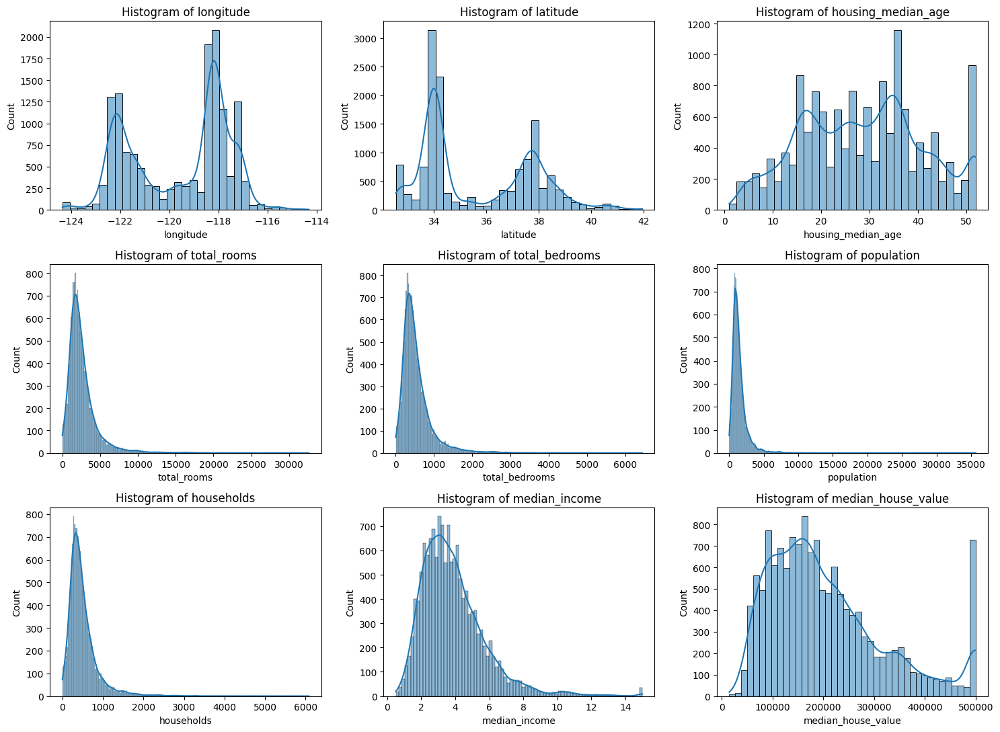

In [5]:
# Plot histograms for numerical features
numerical_features = ['longitude', 'latitude', 
                      'housing_median_age', 'total_rooms', 'total_bedrooms',
                      'population', 'households', 'median_income', 'median_house_value']

plt.figure(figsize=(15, 11))
for i, feature in enumerate(numerical_features, 1):
    plt.subplot(3, 3, i)
    sns.histplot(df[feature], kde=True)
    plt.title(f'Histogram of {feature}')
    plt.xlabel(feature)

plt.tight_layout()
plt.show()

Dari grafik di atas untuk semua data numerik yang kita miliki, kita dapat mengambil kesimpulan bahwa semua data tidak terdistribusi dengan normal. Oleh karena itu untuk `Central Tendency`-nya kita dapat menggunakan median jika nanti diperlukan dalam analisis. 

Berdasarkan plot distribusi harga rumah di California di atas, terlihat bahwa terdapat 'right-skewed distribution'. Dengan kata lain, terdapat skewness positif pada fitur `median_house_value`.

**Correlation Between Dataset**

Karena data tidak terdistibusi dengan normal, kita akan melihat korelasi antar data dengan menggunakan metode `spearman`.

<Axes: >

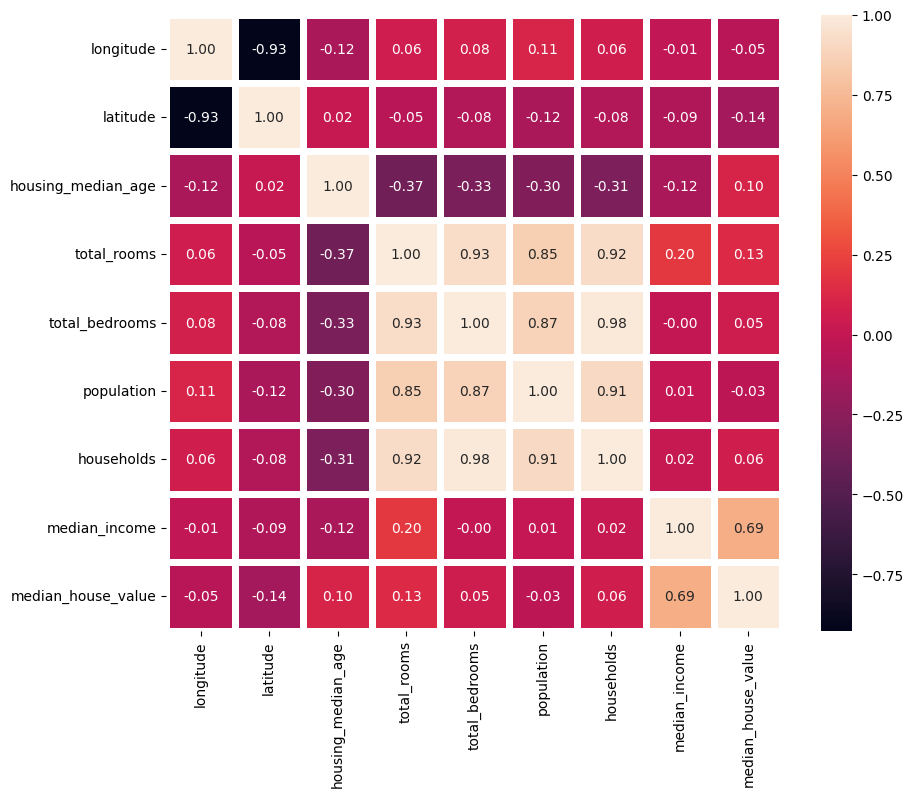

In [6]:
plt.figure(figsize=(10,8))
sns.heatmap(df.corr('spearman'), annot=True,square=True,linewidths=5,fmt='.2f')

Terlihat untuk korelasi median_house_value yang paling kuat adalah dengan median_income, kita dapat mengambil kesimpulan bahwa semakin naik pendapatan penduduknya maka semakin naik pula nilai harga jual rumahnya. Kemudian terlihat juga untuk korelasi negatif yang paling kuat antara median_house_value dengan latitude, ini mengindikasikan bahwa semakin ke utara harga rumahnya semakin menurun.

**Types of ocean proximity related to price**

In [7]:
# Cek median price untuk tiap kategori ocean proximity-nya
df_median_price = df.groupby(by=['ocean_proximity']).agg({'median_house_value':'median'}).reset_index()
df_median_price = df_median_price.set_index('ocean_proximity')
df_median_price = df_median_price.sort_values('median_house_value', ascending =False)
df_median_price.head()

,median_house_value
ocean_proximity,
ISLAND,351100.0
NEAR BAY,230800.0
NEAR OCEAN,228600.0
<1H OCEAN,214800.0
INLAND,108800.0


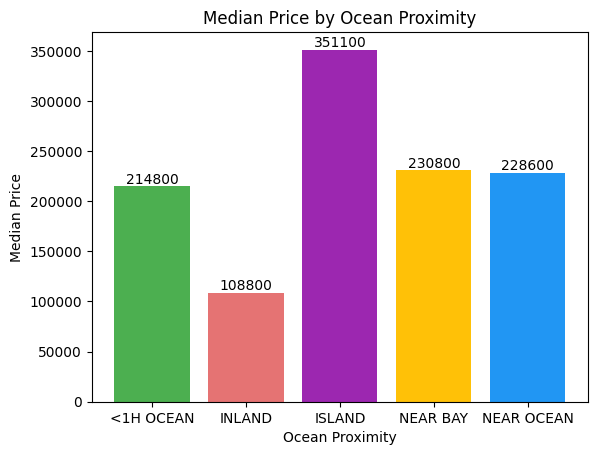

In [8]:
# Hitung median masing-masing kategori ocean_proximity
median_prices = df.groupby('ocean_proximity')['median_house_value'].median()

# Tentukan warna untuk masing-masing kategori ocean_proximity
colors = {'INLAND': '#E57373', 'NEAR BAY': '#FFC107', '<1H OCEAN': '#4CAF50', 'NEAR OCEAN': '#2196F3', 'ISLAND': '#9C27B0'}

# Plot grafik barchart dengan label harga di atas setiap batang dan warna yang ditentukan
bars = plt.bar(median_prices.index, median_prices.values, color=[colors[key] for key in median_prices.index])

# Tambahkan label harga di atas setiap batang
for bar in bars:
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), str(int(bar.get_height())), ha='center', va='bottom')

# Tambahkan label dan judul
plt.xlabel('Ocean Proximity')
plt.ylabel('Median Price')
plt.title('Median Price by Ocean Proximity')

# Tampilkan grafik
plt.show()

Untuk rumah yang memiiliki harga median paling tinggi adalah daerah dengan kategori `ISLAND`, di mana daerah tersebut memang merupakan pulau privat. Kemudian untuk rumah yang berada di dekat pantai seperti `NEAR BAY` dan `NEAR OCEAN` tidak jauh berbeda untuk median harganya, memang secara geografis kedua area tersebut berada di tepi pantai. 

**Location**

In [9]:
# Inisialisasi peta
m = folium.Map(location=[36.778259, -119.417931], zoom_start=6, tiles='cartodbpositron', scrollWheelZoom=False, zoom_control=True)

# Tampilkan judul
title_html = """
             <h3 align="center" style="font-size:20px"><b>Ocean Proximity California Housing</b></h3>
             """
m.get_root().html.add_child(folium.Element(title_html))

# Tambahkan legenda
def add_legend(map_obj):
    legend_html = '''
        <div style="position: fixed; 
                    bottom: 50px; left: 50px; width: 140px; height: 130px; 
                    border:2px solid grey; z-index:9999; font-size:14px;
                    ">&nbsp; <b>Legend</b> <br>
                      &nbsp; INLAND &nbsp; <i class="fa fa-circle 
                                  fa-1x" style="color:#E57373"></i><br>
                      &nbsp; NEAR BAY &nbsp; <i class="fa fa-circle 
                                  fa-1x" style="color:#FFC107"></i><br>
                      &nbsp; <1H OCEAN &nbsp; <i class="fa fa-circle 
                                  fa-1x" style="color:#4CAF50"></i><br>
                      &nbsp; NEAR OCEAN &nbsp; <i class="fa fa-circle 
                                  fa-1x" style="color:#2196F3"></i><br>
                      &nbsp; ISLAND &nbsp; <i class="fa fa-circle 
                                  fa-1x" style="color:#9C27B0"></i><br>
        </div>
        '''
    map_obj.get_root().html.add_child(folium.Element(legend_html))

add_legend(m)

# Tambahkan titik-titik dengan warna berdasarkan kategori
colors = {'INLAND': '#E57373', 'NEAR BAY': '#FFC107', '<1H OCEAN': '#4CAF50', 'NEAR OCEAN': '#2196F3', 'ISLAND': '#9C27B0'}
for index, row in df.iterrows():
    color = colors.get(row['ocean_proximity'], '#000000')  # Default color black for unknown values
    
    folium.CircleMarker(location=[row['latitude'], row['longitude']],
                        radius=5,
                        color=color,
                        fill=True,
                        fill_color=color).add_to(m)

# Tampilkan peta
m


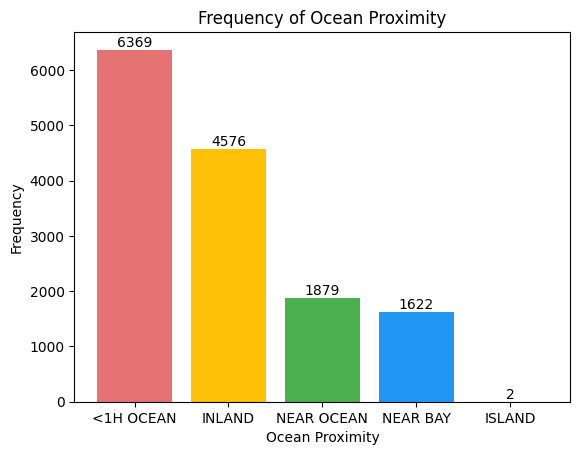

In [10]:
# Hitung frekuensi masing-masing kategori ocean_proximity
ocean_proximity_counts = df['ocean_proximity'].value_counts()

# Plot histogram
bars = plt.bar(ocean_proximity_counts.index, ocean_proximity_counts.values, color=['#E57373', '#FFC107', '#4CAF50', '#2196F3', '#9C27B0'])

# Tambahkan label untuk setiap bar
for bar in bars:
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), str(int(bar.get_height())), ha='center', va='bottom')

# Tambahkan label dan judul
plt.xlabel('Ocean Proximity')
plt.ylabel('Frequency')
plt.title('Frequency of Ocean Proximity')

# Tampilkan grafik
plt.show()

Mayoritas rumah adalah yang memiliki kategori `<1H OCEAN` dengan populasi mencapai 6.369 rumah, sedangkan yang paling sedikit adalah rumah yang berada di pulau pribadi (`ISLAND`) dengan hanya 2 rumah. Hal ini mengindikasikan bahwa penduduk California menyukai rumah yang tidak dekat pantai namut juga tidak jauh dari pantai.

**Price by Location**

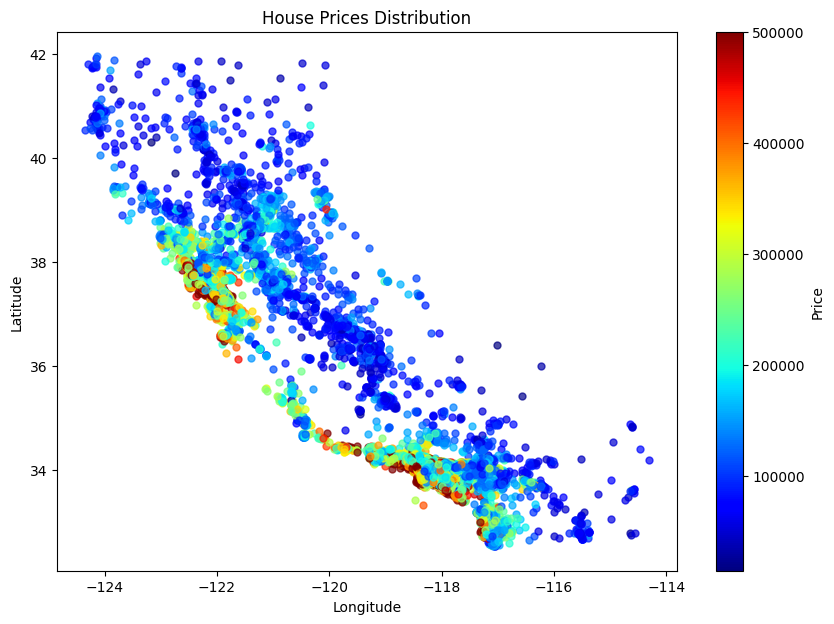

In [11]:
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable

# Determine the price range
min_price = df['median_house_value'].min()
max_price = df['median_house_value'].max()

# Create colormap
cmap = plt.get_cmap('jet')

# Normalize the price range
norm = Normalize(vmin=min_price, vmax=max_price)

# Create ScalarMappable for the colormap
sm = ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])  # This is crucial to set the array

# Create a figure and axis
fig, ax = plt.subplots(figsize=(10, 7))

# Plot
for index, row in df.iterrows():
    color = cmap(norm(row['median_house_value']))
    ax.plot(row['longitude'], row['latitude'], marker='o', markersize=5, color=color, alpha=0.7)

# Add colorbar
cbar = fig.colorbar(sm, ax=ax)
cbar.set_label('Price')

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_title('House Prices Distribution')

plt.show()


Kita dapat melihat bahwa jika rumah semakin dekat dengan pantai, maka semakin tinggi pula harganya.

## **Data Preparation**

### **Data Preprocessing**

Pada tahap ini, kita akan melakukan cleaning pada data yang nantinya data yang sudah dibersihkan akan kita gunakan untuk proses analisis selanjutnya. Beberapa hal yang perlu dilakukan adalah:
- Drop fitur yang tidak memiliki relevansi terhadap permasalahan yang sedang dihadapi.
- Melakukan treatment terhadap missing value jika ada. Bisa dengan cara men-drop fiturnya jika memang tidak dibutuhkan atau bisa juga dengan mengimputasi dengan nilai yang paling masuk akal berdasarkan kasusnya.

Untuk proses data preprocessing dan feature engineering, kita akan menggunakan dataframe hasil duplikasi dari dataframe yang sebelumnya digunakan.

In [12]:
df_model = df.copy()

In [13]:
# Cek info lebih detail untuk setiap fitur
listItem = []

for col in df_model.columns:
    listItem.append([col, df_model[col].dtype, df_model[col].isna().sum(), round((df_model[col].isna().sum()/len(df_model[col]))*100, 2),
                    df_model[col].nunique(), list(df_model[col].drop_duplicates().sample(2).values)]);

df_model_desc = pd.DataFrame(columns=['dataFeatures', 'dataType', 'null', 'nullPct', 'unique', 'uniqueSample'],
                     data=listItem)
df_model_desc

,dataFeatures,dataType,null,nullPct,unique,uniqueSample
0,longitude,float64,0,0.00,806,"[-123.23, -123.18]"
1,latitude,float64,0,0.00,836,"[40.31, 35.16]"
2,housing_median_age,float64,0,0.00,52,"[18.0, 36.0]"
3,total_rooms,float64,0,0.00,5227,"[4927.0, 1238.0]"
4,total_bedrooms,float64,137,0.95,1748,"[343.0, 1703.0]"
5,population,float64,0,0.00,3498,"[2274.0, 1883.0]"
6,households,float64,0,0.00,1649,"[1264.0, 118.0]"
7,median_income,float64,0,0.00,9797,"[7.3518, 3.6969]"
8,ocean_proximity,object,0,0.00,5,"[ISLAND, INLAND]"
9,median_house_value,float64,0,0.00,3548,"[233100.0, 331600.0]"


Dari info dataset di atas, terdapat data yang kosong pada beberapa fitur atau kolom. Selanjutnya, kita perlu mengobservasi lebih lanjut terkait data-data yang hilang tersebut agar dapat menentukan langkah treatment yang tepat untuk mengatasinya.

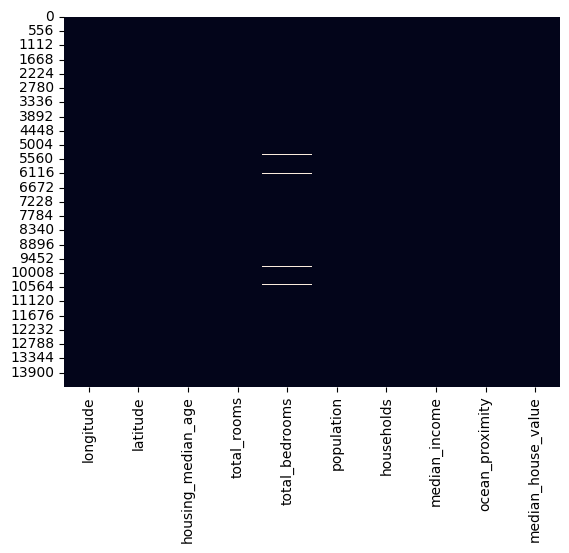

In [14]:
# Missing value heatmap
sns.heatmap(df_model.isnull(), cbar=False);

Hanya terdapat 1 fitur yang memiliki missing value yaitu fitur total_bedrooms. Berhubung hanya  di bawah 1%, maka kita tidak perlu memikirkannya, bisa kita drop saja missing valuenya.

**Data Duplicate**

In [15]:
# Cek nilai missing value
df_model.duplicated().sum()

0

Tidak terdapat data yang duplikat pada dataset ini. Ini berarti setiap datanya bernilai unik.

**Missing Value**

In [16]:
# Cek nilai missing value
df_model.isnull().sum()

longitude               0
latitude                0
housing_median_age      0
total_rooms             0
total_bedrooms        137
population              0
households              0
median_income           0
ocean_proximity         0
median_house_value      0
dtype: int64

Hanya fitur `total_bedrooms` yang memiliki missing value, sesuai analisis di atas kita bisa drop saja karena persentasenya kurang dari 1%.

In [17]:
# Hapus missing value
df_model.dropna(inplace=True)

In [18]:
# Cek nilai missing value
df_model.isnull().sum()

longitude             0
latitude              0
housing_median_age    0
total_rooms           0
total_bedrooms        0
population            0
households            0
median_income         0
ocean_proximity       0
median_house_value    0
dtype: int64

Sekarang data kita sudah bersih dari missing value.

**Outliers**

Banyaknya outliers pada data tentu akan memengaruhi hasil analisis dan pemodelan yang dilakukan. Ada beberapa hal yang harus dipertimbangkan sebelum memutuskan treatment yang sesuai dengan data, di antaranya adalah dengan mempertimbangkan sisi domain knowledge.

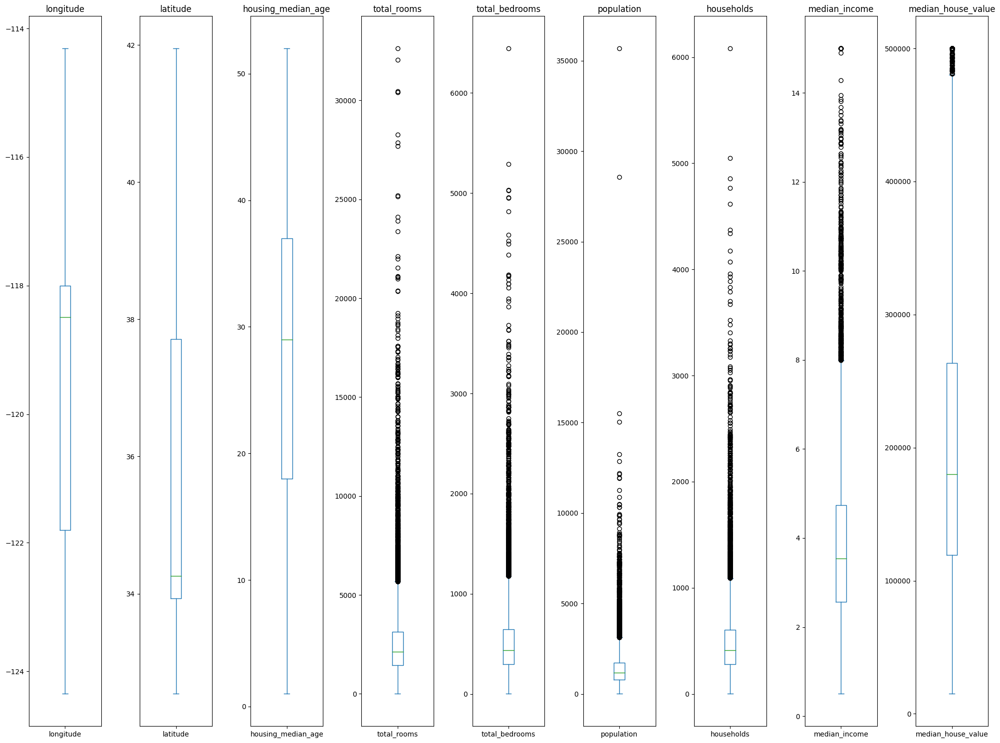

In [19]:
fig, axs = plt.subplots(nrows=1, ncols=9, figsize=(20,15))

for i, column in enumerate(df_model.drop(columns=['ocean_proximity'])):
    df_model[column].plot.box(ax=axs[i])
    axs[i].set_title(column)

plt.tight_layout()
plt.show()

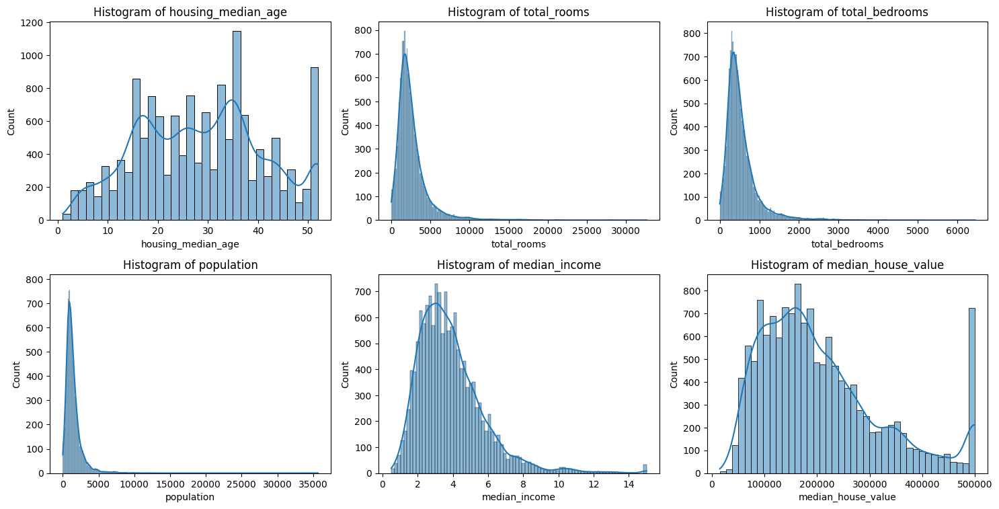

In [20]:
# Plot histograms for numerical features
numerical_features = ['housing_median_age', 'total_rooms', 'total_bedrooms', 'population', 'median_income', 'median_house_value']

plt.figure(figsize=(15, 11))
for i, feature in enumerate(numerical_features, 1):
    plt.subplot(3, 3, i)
    sns.histplot(df_model[feature], kde=True)
    plt.title(f'Histogram of {feature}')
    plt.xlabel(feature)

plt.tight_layout()
plt.show()

Terlihat banyak sekali outliers pada beberapa fitur. Walaupun keberadaan outlier dapat mempengaruhi model machine learning kita, tapi tidak selamanya outlier harus dihilangkan. Adanya outlier dalam suatu data bukan berarti data tersebut buruk, bisa jadi outlier yang ada mengandung informasi yang berguna yang bisa dimanfaatkan untuk analisis data. Dalam project ini, untuk membuat dataset yang lebih bersih dari outliers, kita akan melakukan beberapa rekayasa data pada fitur-fitur dengan mempertimbangkan kombinasi antara hasil dari metode IQR dan juga domain knowledge. Nantinya, model yang dihasilkan hanya terbatas dapat memprediksi listing baru yang nilai-nilainya pada rentang data berdasarkan `clean dataset` ini saja. Di luar rentang data, hasil prediksi dari model akan menjadi bias.

Dalam kasus ini, outliers yang akan dihilangkan hanya yang bernilai paling extreme saja. Karena jika semua dihilangkan, kita akan kehilangan banyak sekali data sehingga tidak merepresentasikan data yang sebenarnya.

Dengan melihat grafik boxplot dan histogram di atas, terlihat ada 2 buah feature yang memiliki outlier yg cukup ekstrem nilainya dibanding data yang lain, yaitu fitur `housing_median_age` dan fitur `median_house_value`. Kedua fitur tersebut akan kita hilangkan outliers-nya. Dalam kasus ini, outliers yang akan dihilangkan hanya yang bernilai paling extreme saja. Karena jika semua dihilangkan, kita akan kehilangan banyak sekali data sehingga tidak merepresentasikan data yang sebenarnya.

Mari kita lihat histogram dari kedua fitur tersebut.

<Axes: xlabel='median_house_value', ylabel='Density'>

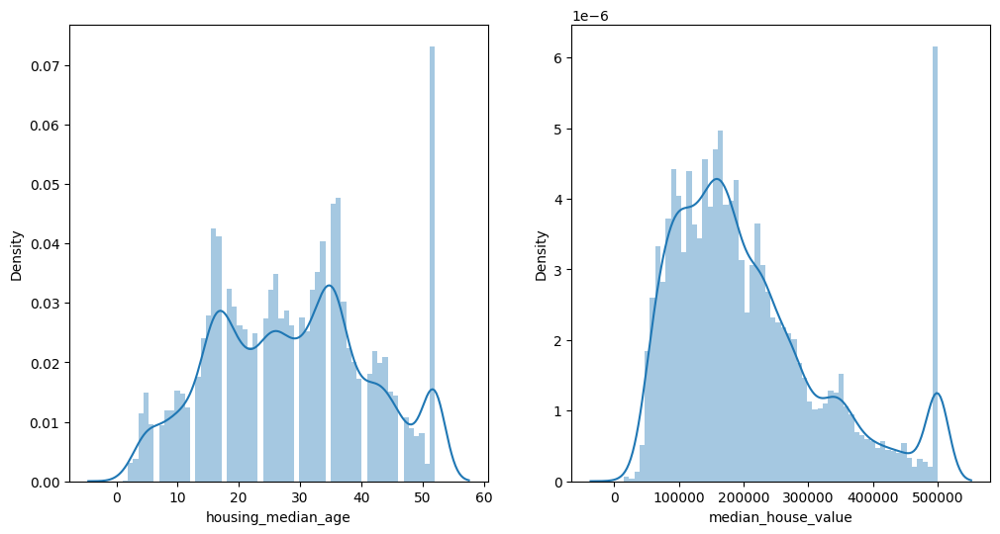

In [21]:
plt.figure(figsize=(12,6))

plt.subplot(1,2,1)
sns.distplot(df_model['housing_median_age'],bins=60)

plt.subplot(1,2,2)
sns.distplot(df_model['median_house_value'],bins=60)

In [22]:
# Membuat fungsi untuk mengecek outliers
def find_anomalies(data):
    q1 = data.quantile(0.25)
    q3 = data.quantile(0.75)
    iqr = q3 - q1
    limit = iqr*1.5
    print(f'IQR: {iqr}')

    limit_bawah = q1 - limit
    limit_atas = q3 + limit
    print(f'limit_bawah: {limit_bawah}')
    print(f'limit_atas: {limit_atas}')

In [23]:
# Outliers pada fitur housing_median_age
find_anomalies(df_model['housing_median_age'])

IQR: 19.0
limit_bawah: -10.5
limit_atas: 65.5


In [24]:
df_model[['housing_median_age']].describe()

,housing_median_age
count,14311.000000
mean,28.609671
std,12.606493
min,1.000000
25%,18.000000
50%,29.000000
75%,37.000000
max,52.000000


In [25]:
df_model[df_model['housing_median_age']>=37]['housing_median_age'].value_counts()

52.0    891
37.0    368
38.0    272
42.0    266
44.0    255
39.0    244
43.0    243
41.0    219
40.0    210
45.0    183
46.0    176
47.0    130
48.0    109
50.0     99
49.0     92
51.0     36
Name: housing_median_age, dtype: int64

Extreme outliers pada fitur `housing_median_age` adalah fitur `housing_median_age` yang bernilai 52. Terlihat terdapat 891 rumah yang berumur 52 tahun. 

Selanjutnya kita akan cek untuk fitur `median_house_value`:

In [26]:
# Outliers pada fitur median_house_value
find_anomalies(df_model['median_house_value'])

IQR: 144350.0
limit_bawah: -97125.0
limit_atas: 480275.0


In [27]:
df_model[['median_house_value']].describe()

,median_house_value
count,14311.000000
mean,206793.156942
std,115404.371629
min,14999.000000
25%,119400.000000
50%,180000.000000
75%,263750.000000
max,500001.000000


In [28]:
df_model[df_model['median_house_value']>462000]['median_house_value'].value_counts().head()

500001.0    672
500000.0     18
483300.0      6
475000.0      6
470800.0      3
Name: median_house_value, dtype: int64

Pada fitur `median_house_value`, outliers paling extreme-nya adalah fitur `median_house_value` yang bernilai 500.001. Terlihat terdapat 547 rumah yang memiliki harga 500.001 USD.

**Added Feature**

1. Room Ratio

Dalam penentuan harga rumah, jumlah kamar (`total_bedrooms`) maupun jumlah ruangan (`total_rooms`) secara total dalam satu blok belum bisa merepresentasikan ukuran dari rumah tersebut. Berdasarkan domain knowledge, ukuran rumah menjadi salah satu faktor dalam penentuan harga rumah. Oleh sebab itu, kita harus menambahkan fitur untuk merepresentasikan ukuran dari rumah tersebut. Sehingga kita akan melihat rasio antara jumlah kamar dan ruangan untuk setiap keluarga dalam satu blok (`household`). Fitur tersebut nantinya akan kita masukkan ke dalam `pipeline`.

In [29]:
df_model_add = df_model.copy()

In [30]:
df_model_add["rooms_per_household"] = df_model_add["total_rooms"]/df_model_add["households"]

df_model_add["bedrooms_per_room"] = df_model_add["total_bedrooms"]/df_model_add["total_rooms"]

df_model_add["population_per_household"]=df_model_add["population"]/df_model_add["households"]

In [31]:
df_model_add.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value,rooms_per_household,bedrooms_per_room,population_per_household
0,-119.79,36.73,52.0,112.0,28.0,193.0,40.0,1.9750,INLAND,47500.0,2.800000,0.250000,4.825000
1,-122.21,37.77,43.0,1017.0,328.0,836.0,277.0,2.2604,NEAR BAY,100000.0,3.671480,0.322517,3.018051
2,-118.04,33.87,17.0,2358.0,396.0,1387.0,364.0,6.2990,<1H OCEAN,285800.0,6.478022,0.167939,3.810440
3,-118.28,34.06,17.0,2518.0,1196.0,3051.0,1000.0,1.7199,<1H OCEAN,175000.0,2.518000,0.474980,3.051000
4,-119.81,36.73,50.0,772.0,194.0,606.0,167.0,2.2206,INLAND,59200.0,4.622754,0.251295,3.628743


<Axes: >

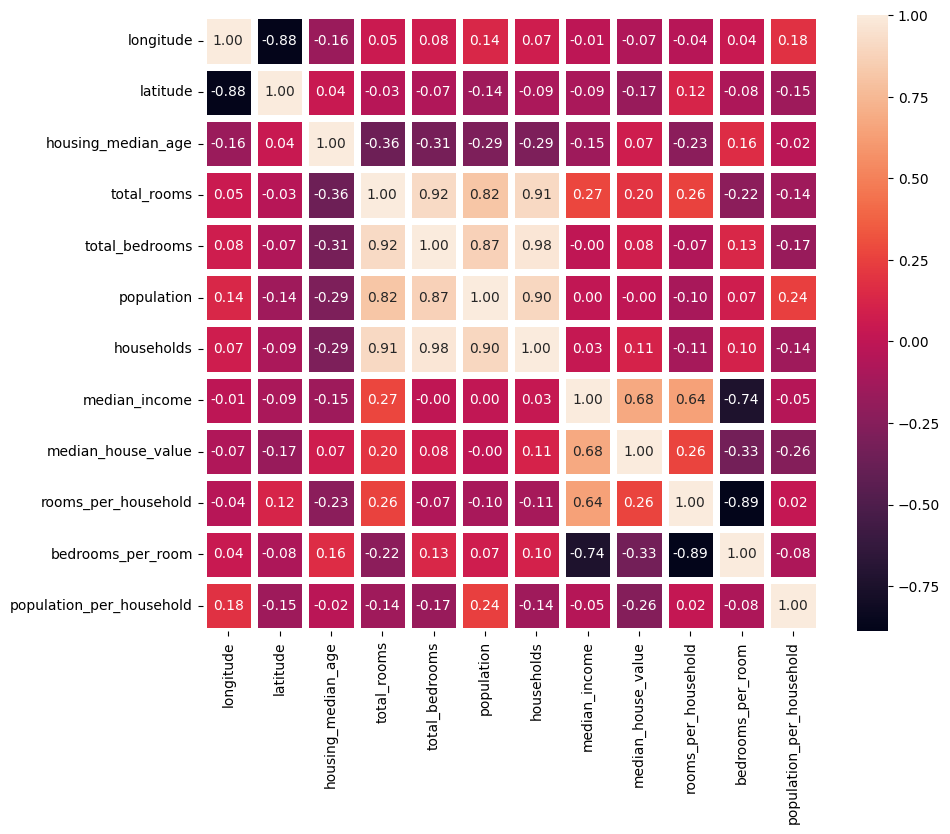

In [32]:
plt.figure(figsize=(10,8))
sns.heatmap(df_model_add.corr('spearman'), annot=True,square=True,linewidths=5,fmt='.2f')

Setelah melakukan percobaan penambahan fitur, ternyata fitur `bedrooms_per_population` memiliki korelasi yang lebih kuat terhadap fitur `median_house_value` daripada fitur `total_rooms` atau `total_bedrooms`. Tentu saja semakin besar ukuran rumah, maka semakin mahal harganya.

Kemudian karena fitur `rooms_per_population` dan `bedrooms_per_population` lebih merepresentasikan ukuran rumah daripada `total_rooms` dan `total_bedrooms`, maka fitur tersebut ditambah fitur `population` dapat kita drop. Sehingga fitur ini yang nantinya akan kita tambahkan ke pipeline.

In [33]:
df_model.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value
0,-119.79,36.73,52.0,112.0,28.0,193.0,40.0,1.9750,INLAND,47500.0
1,-122.21,37.77,43.0,1017.0,328.0,836.0,277.0,2.2604,NEAR BAY,100000.0
2,-118.04,33.87,17.0,2358.0,396.0,1387.0,364.0,6.2990,<1H OCEAN,285800.0
3,-118.28,34.06,17.0,2518.0,1196.0,3051.0,1000.0,1.7199,<1H OCEAN,175000.0
4,-119.81,36.73,50.0,772.0,194.0,606.0,167.0,2.2206,INLAND,59200.0


In [34]:
display(df_model.describe(), df_model.describe(include='object'))

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,14311.000000,14311.000000,14311.000000,14311.000000,14311.000000,14311.000000,14311.000000,14311.000000,14311.000000
mean,-119.567150,35.631365,28.609671,2640.917686,538.260709,1424.772273,499.480470,3.866774,206793.156942
std,2.006374,2.139589,12.606493,2197.192896,423.577544,1151.795857,383.826005,1.890866,115404.371629
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.800000,33.930000,18.000000,1452.000000,295.000000,784.000000,279.000000,2.569400,119400.000000
50%,-118.490000,34.260000,29.000000,2125.000000,435.000000,1164.000000,410.000000,3.540300,180000.000000
75%,-118.000000,37.715000,37.000000,3142.000000,647.000000,1722.000000,603.500000,4.736100,263750.000000
max,-114.310000,41.950000,52.000000,32627.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


,ocean_proximity
count,14311
unique,5
top,<1H OCEAN
freq,6300


2. City

Data asli kita hanya memiliki latitude, longitude, dan ocean_proximity sebagai acuan lokasinya. Tetapi, latitude dan longitude memiliki kardinalitas yang tinggi. Oleh sebab itu kita akan menambahkan fitur city.

_Note: Jalankan query di bawah ini untuk mendapatkan file yang sudah terdapat fitur city. Saya sarankan menjalankan query melalui Google Collab untuk menyingkat waktu._

In [35]:
# import reverse_geocoder as rg
# import pandas as pd

# df_convert = df[['latitude','longitude']]

# dfs = []

# def get_data(lat, lng):
#     coordinates = (lat,lng)
#     return rg.search(coordinates)[0]['name']

# for i, r in df_convert.iterrows():
#     try:
#         lat = r['latitude']
#         lng = r['longitude']
#         results = get_data(lat, lng)
#         if results:
#             temp_df = pd.DataFrame([results], columns=['city_name'])
#             dfs.append(temp_df)
#         else:
#             dfs.append(pd.DataFrame([None], columns=['city_name']))
#     except Exception as e:
#         print(f"An error occurred at index {i}: {e}")
#         dfs.append(pd.DataFrame([None], columns=['city_name']))

# if dfs:
#     road_names = pd.concat(dfs, ignore_index=True)
#     df_convert['city_name'] = road_names['city_name']
# else:
#     df_convert['city_name'] = pd.Series([None]*len(df_convert))

# df_convert.to_csv('new_data_city_california.csv')


Setelah mendapatkan fitur city, kita akan lakukan penggabungan antara file tersebut dengan file asli `data_california_house.csv`.

In [36]:
dfCity = pd.read_csv('new_data_city_california.csv').drop(columns=['Unnamed: 0'])

In [37]:
dfCity = dfCity.drop_duplicates(subset=['latitude', 'longitude'])

In [38]:
merged_df = pd.merge(df, dfCity, on=['latitude', 'longitude'], how='outer')

In [39]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 14448 entries, 0 to 14447
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           14448 non-null  float64
 1   latitude            14448 non-null  float64
 2   housing_median_age  14448 non-null  float64
 3   total_rooms         14448 non-null  float64
 4   total_bedrooms      14311 non-null  float64
 5   population          14448 non-null  float64
 6   households          14448 non-null  float64
 7   median_income       14448 non-null  float64
 8   ocean_proximity     14448 non-null  object 
 9   median_house_value  14448 non-null  float64
 10  city_name           14448 non-null  object 
dtypes: float64(9), object(2)
memory usage: 1.3+ MB


Masih terdapat nilai `Nan` di fitur `total_bedrooms`, kita drop saja karena jumlahnya hanya 137.

In [40]:
merged_df.dropna(inplace=True)

In [41]:
merged_df.isna().sum()

longitude             0
latitude              0
housing_median_age    0
total_rooms           0
total_bedrooms        0
population            0
households            0
median_income         0
ocean_proximity       0
median_house_value    0
city_name             0
dtype: int64

Sekarang data kita sudah bersih dari nilai `Nan`. Kemudian kita juga sudah mendapatkan fitur city sebagai pengganti fitur latitude dan longitude, sehingga kita bisa drop fitur latitude dan longitude untuk menghindari kardinalitas.

In [42]:
merged_df = merged_df.drop(columns=['latitude', 'longitude'])

In [43]:
merged_df.head()

,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value,city_name
0,52.0,112.0,28.0,193.0,40.0,1.9750,INLAND,47500.0,Fresno
1,43.0,1017.0,328.0,836.0,277.0,2.2604,NEAR BAY,100000.0,Alameda
2,52.0,745.0,153.0,473.0,149.0,2.6765,NEAR BAY,88800.0,Alameda
3,46.0,1234.0,375.0,1183.0,354.0,2.3309,NEAR BAY,98700.0,Alameda
4,17.0,2358.0,396.0,1387.0,364.0,6.2990,<1H OCEAN,285800.0,La Palma


In [44]:
merged_df.describe(include='object')

,ocean_proximity,city_name
count,14311,14311
unique,5,1032
top,<1H OCEAN,San Francisco
freq,6300,247


**Clean Data**

Setelah melakukan data manipulasi, kita mendapatkan data yang bersih untuk dapat dilakukan pemodelan. Sehingga nantinya limitasi model kita berdasarkan `clean dataset` ini.

## **Modelling**

### **Experiment**

Fitur `rooms_per_household`, `bedrooms_per_room`, dan `population_per_household` akan kita masukkan ke dalam pipeline.
* `population_per_household` menunjukkan seberapa besar rasio jumlah populasi dengan jumlah KK. Semakin besar rasionya, berarti semakin banyak jumlah anggota keluarga dalam satu KK.
* `rooms_per_household` menunjukkan seberapa besar rasio antara jumlah ruangan dengan jumlah KK. Semakin banyak jumlah KK, berarti semakin banyak juga ruangan dalam satu rumah.
* `bedrooms_per_room` menunjukkan seberapa banyak jumlah kamar tidur jika dibandingkan dengan total ruangan dalam satu rumah. Semakin besar rasionya, tentunya rumah tersebut semakin banyak jumlah kamar tidurnya.

In [45]:
# Import Library
import numpy as np
from sklearn.model_selection import train_test_split
from pycaret.internal.preprocess.transformers import TransformerWrapper
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, RobustScaler
from sklearn.base import BaseEstimator, TransformerMixin
from category_encoders import BinaryEncoder, LeaveOneOutEncoder
from scipy.stats.mstats import winsorize

from pycaret.classification import *
from pycaret.regression import RegressionExperiment
from sklearn.metrics import mean_absolute_error, mean_squared_error

#### 1. Experiment 1

Pada experiment 1, kita akan mencoba handling outliers dengan winsorization. Outliers kita atan ubah dengan percentil 97,3 untuk fitur `housing_median_age` dan percentil 95,2 untuk fitur `median_house_value`. Pemilihan percentil ini secara random saja, tidak ada aturan tertentu dalam penentuan nilainya.

**Feature Transformation:**
Agar model dapat bekerja dengan baik, di experiment 1 ini kita akan melakukan feature transformation untuk masing-masing fiturnya.

* Numerical Feature: Model machine learning sangat sensitif dengan skala fiturnya. Oleh karena itu, data numerik yang tidak terdistribusi dengan normal, kita akan menggunakan metode Robust Scaler untuk transformasinya.
* Categorical Feature: Model machine learning bekerja dengan mengidentifikasi angka/numerik. Oleh karena itu, fitur kategorikal yang kita miliki akan kita ubah menggunakan Binary Encoder. Panduan dalam pemilihan metode transformasi untuk fitur kategorikal dapat dilihat [di sini](https://raw.githubusercontent.com/alteryx/categorical_encoding/090e8d207aa14dd278e03209b4663cf9af0cad45/guides/flowchart/Categorical%20Encoding%20Flowchart.png).

In [46]:
df_trial_winsor = merged_df.copy()

In [47]:
# Winsorize Outliers
df_trial_winsor['housing_median_age'] = winsorize(df_trial_winsor['housing_median_age'], limits=(0, 0.063))
df_trial_winsor['median_house_value'] = winsorize(df_trial_winsor['median_house_value'], limits=(0, 0.048))


In [48]:
RANDOM_STATE = 10

In [49]:
# Split dataset
df_seen, df_unseen = train_test_split(df_trial_winsor,test_size=0.2, random_state=RANDOM_STATE)

In [50]:
class Cleaning1(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass

    def fit(self, X, y=None):
        return self
    
    def transform(self, X, y=None):
        # Buat Fitur Baru
        X["rooms_per_household"] = X["total_rooms"]/X["households"]
        X["bedrooms_per_room"] = X["total_bedrooms"]/X["total_rooms"]
        X["population_per_household"] = X["population"]/X["households"]

        # Drop fitur lama
        X.drop(columns=['total_rooms','total_bedrooms','population','households'], inplace=True)

        return X

#Integrasikan data preparation

pipeline = [
    ("cleaning", TransformerWrapper(include=['total_rooms','total_bedrooms','population','households'], transformer=Cleaning1())),
    ("binary", TransformerWrapper(include=['ocean_proximity','city_name'], transformer=BinaryEncoder())),
    ("scaler", ColumnTransformer([("scaler", RobustScaler(),['housing_median_age', 'median_income','rooms_per_household', 'bedrooms_per_room','population_per_household'])], remainder='passthrough', verbose_feature_names_out=False)),
]

In [51]:
configs = {
    'data': df_seen, 
    'target': 'median_house_value', 
    'train_size': 0.8,
    'verbose': False,
    'preprocess': False,
    'session_id': RANDOM_STATE, 
    'custom_pipeline_position': 0,
    'system_log': False,
    'log_experiment': False
} 

In [52]:
exp1=RegressionExperiment()
exp1.setup(custom_pipeline=pipeline,**configs),
exp1.add_metric('MAE', 'MAE', mean_absolute_error, greater_is_better=False)
exp1.add_metric('RMSE', 'RMSE', mean_squared_error, greater_is_better=False, squared=False)
exp1.get_config('pipeline')

Pipeline(memory=FastMemory(location=C:\Users\user\AppData\Local\Temp\joblib),
         steps=[('cleaning',
                 TransformerWrapper(transformer=TransformerWrapper(include=['total_rooms',
                                                                            'total_bedrooms',
                                                                            'population',
                                                                            'households'],
                                                                   transformer=Cleaning1()))),
                ('binary',
                 TransformerWrapper(transformer=TransformerWrapper(include=['ocean_proximity',
                                                                            'city_name'],
                                                                   transforme...
...           ...          ...          ...          ...          ...  
 983            1            0            1            1            1  
 984            1            1            0            0            0  
 985            1            1            0            0            1  
-1              0            0            0            0            0  
-2              0            0            0            0            0  

[987 rows x 10 columns]}])))),
                ('scaler',
                 TransformerWrapper(transformer=ColumnTransformer(remainder='passthrough',
                                                                  transformers=[('scaler',
                                                                                 RobustScaler(),
                                                                                 ['housing_median_age',
                                                                                  'median_income',
                                                                                  'rooms_per_household',
                                                                                  'bedrooms_per_room',
                                                                                  'population_per_household'])],
                                                                  verbose_feature_names_out=False)))])

In [53]:
bm1=exp1.compare_models(sort='RMSE')

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,36792.1182,3009719417.8983,54810.1625,0.7757,0.2729,0.2129,4.0770
knn,K Neighbors Regressor,36276.8012,3168275328.0000,56206.2387,0.7642,0.2767,0.2051,4.2830
lightgbm,Light Gradient Boosting Machine,39529.8652,3269867064.6222,57147.5254,0.7564,0.2887,0.2297,3.9770
rf,Random Forest Regressor,40591.0220,3470311814.4304,58881.0100,0.7415,0.2946,0.2365,4.2410
gbr,Gradient Boosting Regressor,42788.0938,3676518418.8013,60598.4733,0.7263,0.3046,0.2480,3.9240
br,Bayesian Ridge,52422.2987,5232224139.5389,72291.0652,0.6109,0.3647,0.2978,3.7880
ridge,Ridge Regression,52416.8208,5232249514.6370,72291.3089,0.6109,0.3642,0.2977,4.1180
llar,Lasso Least Angle Regression,52415.2915,5232304621.9420,72291.7158,0.6109,0.3637,0.2977,3.9900
lasso,Lasso Regression,52415.2904,5232304639.7019,72291.7158,0.6109,0.3637,0.2977,4.0220
lr,Linear Regression,52415.0355,5232307453.4361,72291.7356,0.6109,0.3635,0.2977,4.4780


Processing:   0%|          | 0/77 [00:00<?, ?it/s]

Dari experiment 1, kita mendapatkan model dengan nilai RMSE paling kecil yaitu Extra Trees Regressor. Hasil `MAE` sebesar 36.792,1182 USD dan `RMSE` sebesar 54.810,1625 USD. Dengan MAPE masih di angka 21%.

#### 2. Experiment 2

Kemudian pada experiment kedua ini kita akan mencoba melakukan handling outliers dengan cara di-drop. Penambahan fitur masih sama seperti dengan experiment 1, begitu juga dengan metode feature transformationnya.

In [54]:
df_trial_drop = merged_df.copy()

In [55]:
df_trial_drop = df_trial_drop.drop(df_trial_drop[df_trial_drop['median_house_value']==500001].index)
df_trial_drop = df_trial_drop.drop(df_trial_drop[df_trial_drop['housing_median_age']==52].index)

In [56]:
# Split dataset
df_seen2, df_unseen2 = train_test_split(df_trial_drop,test_size=0.2, random_state=RANDOM_STATE)

In [57]:
class Cleaning2(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass

    def fit(self, X, y=None):
        return self
    
    def transform(self, X, y=None):
        # Buat Fitur Baru
        X["rooms_per_household"] = X["total_rooms"]/X["households"]
        X["bedrooms_per_room"] = X["total_bedrooms"]/X["total_rooms"]
        X["population_per_household"] = X["population"]/X["households"]

        # Drop fitur lama
        X.drop(columns=['total_rooms','total_bedrooms','population','households'], inplace=True)

        return X

#Integrasikan data preparation

pipeline = [
    ("cleaning", TransformerWrapper(include=['total_rooms','total_bedrooms','population','households'], transformer=Cleaning2())),
    ("binary", TransformerWrapper(include=['ocean_proximity','city_name'], transformer=BinaryEncoder())),
    ("scaler", ColumnTransformer([("scaler", RobustScaler(),['housing_median_age', 'median_income','rooms_per_household', 'bedrooms_per_room','population_per_household'])], remainder='passthrough', verbose_feature_names_out=False)),
]

In [58]:
configs = {
    'data': df_seen2, 
    'target': 'median_house_value', 
    'train_size': 0.8,
    'verbose': False,
    'preprocess': None,
    'session_id': RANDOM_STATE, 
    'custom_pipeline_position': 0,
    'system_log': False,
    'log_experiment': False
} 

In [59]:
exp2=RegressionExperiment()
exp2.setup(custom_pipeline=pipeline,**configs),
exp2.add_metric('MAE', 'MAE', mean_absolute_error, greater_is_better=False)
exp2.add_metric('RMSE', 'RMSE', mean_squared_error, greater_is_better=False, squared=False)
exp2.get_config('pipeline')

Pipeline(memory=FastMemory(location=C:\Users\user\AppData\Local\Temp\joblib),
         steps=[('cleaning',
                 TransformerWrapper(transformer=TransformerWrapper(include=['total_rooms',
                                                                            'total_bedrooms',
                                                                            'population',
                                                                            'households'],
                                                                   transformer=Cleaning2()))),
                ('binary',
                 TransformerWrapper(transformer=TransformerWrapper(include=['ocean_proximity',
                                                                            'city_name'],
                                                                   transforme...
...           ...          ...          ...          ...          ...  
 968            0            1            0            0            0  
 969            0            1            0            0            1  
 970            0            1            0            1            0  
-1              0            0            0            0            0  
-2              0            0            0            0            0  

[972 rows x 10 columns]}])))),
                ('scaler',
                 TransformerWrapper(transformer=ColumnTransformer(remainder='passthrough',
                                                                  transformers=[('scaler',
                                                                                 RobustScaler(),
                                                                                 ['housing_median_age',
                                                                                  'median_income',
                                                                                  'rooms_per_household',
                                                                                  'bedrooms_per_room',
                                                                                  'population_per_household'])],
                                                                  verbose_feature_names_out=False)))])

In [60]:
bm2=exp2.compare_models(sort='RMSE')

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
knn,K Neighbors Regressor,32802.3027,2437750092.8000,49338.9066,0.7331,0.2644,0.1991,3.9770
et,Extra Trees Regressor,33862.9876,2442364400.0101,49352.3276,0.7325,0.2648,0.2080,4.0240
lightgbm,Light Gradient Boosting Machine,36077.4322,2597181720.5677,50893.1719,0.7155,0.2761,0.2212,3.9400
rf,Random Forest Regressor,37514.3984,2814390624.9266,53004.0719,0.6918,0.2837,0.2298,3.9830
gbr,Gradient Boosting Regressor,38632.1146,2887910864.9141,53693.2940,0.6837,0.2914,0.2388,3.9390
ada,AdaBoost Regressor,58554.5398,5056044299.7890,71017.3858,0.4470,0.4318,0.4471,4.2090
omp,Orthogonal Matching Pursuit,54042.1820,5102973765.5789,71410.9481,0.4417,0.4029,0.3578,3.8700
br,Bayesian Ridge,45059.6477,6742979116.3816,73325.5652,0.2645,0.3341,0.2806,3.9790
ridge,Ridge Regression,45061.3203,6743823123.1064,73328.5707,0.2644,0.3342,0.2806,3.9010
lasso,Lasso Regression,45061.9870,6744011503.7698,73329.4287,0.2644,0.3343,0.2805,3.9580


Processing:   0%|          | 0/77 [00:00<?, ?it/s]

Ternyata kasil nilai `RMSE` yang dihasilkan dari experiment 2 dengan melakukan drop pada outliers lebih baik daripada experiment 1, kita mendapatkan model terbaik K-Neighbors Regressor dengan nilai `MAE` sebesar 32.802,3027  dan `RMSE` sebesar 49.338,9066. Ditinjau dari segi `MAPE`-nya juga sudah di bawah 20% atau lebih tepatnya nilainya di angka 19,9%.

Jika experiment 1 dan experiment 2 dibandingkan, tentu experiment 2 yang menggunakan metode drop untuk handling outliers lebih baik daripada experiment 1 yang menggunakan metode winsorization. Hal tersebut dapat terjadi apabila dibandingkan dengan metode drop, winsorization juga memiliki kekurangan, yaitu dapat mengaburkan informasi sebenarnya yang terkandung dalam outliers. Sedangkan drop menghapus keseluruhan baris di semua fiturnya, sehingga dataset yang tersisa tetap murni dan tidak dimodifikasi.

#### 3. Experiment 3

Leave-One-Out adalah bentuk dari target encoding di mana nilai rata-rata atau nilai yang diharapkan dihitung dengan mengabaikan nilai dalam baris saat ini. Jadi, misalnya kita memiliki sebuah kolom dengan kategori, ketika kita ingin melakukan encoding "leave one out" pada suatu baris, kita mengabaikan nilai kategori pada baris tersebut dan kemudian menghitung rata-rata atau nilai yang diharapkan dari kolom tersebut, tanpa mempertimbangkan nilai pada baris tersebut. Ini digunakan untuk menghindari overfitting saat menggunakan target encoding di mana kita menggunakan nilai target aktual dari baris tersebut. Dengan menggunakan "leave one out encoding", kita mengurangi kemungkinan overfitting dengan cara mengabaikan nilai dari baris tersebut saat menghitung nilai encoding. Metode ini dapatt kita gunakan jika kita memiliki fitur dengan kardinalitas di atas 15.

Fitur yang akan kita terapkan metode Leave-One-Out ini adalah fitur `city_name` yang memiliki kardinalitas sebanyak 1.032. Experiment 3 ini akan menggunakan basis dari experiment 2, di mana handling outliers dengan cara di-drop.

In [61]:
# Split dataset
df_seen3, df_unseen3 = train_test_split(df_trial_drop,test_size=0.2, random_state=RANDOM_STATE)

In [62]:
class Cleaning3(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass

    def fit(self, X, y=None):
        return self
    
    def transform(self, X, y=None):
        # Buat Fitur Baru
        X["rooms_per_household"] = X["total_rooms"]/X["households"]
        X["bedrooms_per_room"] = X["total_bedrooms"]/X["total_rooms"]
        X["population_per_household"] = X["population"]/X["households"]

        # Drop fitur lama
        X.drop(columns=['total_rooms','total_bedrooms','population','households'], inplace=True)

        return X

#Integrasikan data preparation

pipeline = [
    ("cleaning", TransformerWrapper(include=['total_rooms','total_bedrooms','population','households'], transformer=Cleaning3())),
    ("binary", TransformerWrapper(include=['ocean_proximity'], transformer=BinaryEncoder())),
    ("leaveoneout", TransformerWrapper(include=['city_name' ], transformer=LeaveOneOutEncoder())),
    ("scaler", ColumnTransformer([("scaler", RobustScaler(),['housing_median_age', 'median_income','rooms_per_household', 'bedrooms_per_room','population_per_household'])], remainder='passthrough', verbose_feature_names_out=False)),
]

In [63]:
configs = {
    'data': df_seen3, 
    'target': 'median_house_value', 
    'train_size': 0.8,
    'verbose': False,
    'preprocess': None,
    'session_id': RANDOM_STATE, 
    'custom_pipeline_position': 0,
    'system_log': False,
    'log_experiment': False
} 

In [64]:
exp3=RegressionExperiment()
exp3.setup(custom_pipeline=pipeline,**configs),
exp3.add_metric('MAE', 'MAE', mean_absolute_error, greater_is_better=False)
exp3.add_metric('RMSE', 'RMSE', mean_squared_error, greater_is_better=False, squared=False)
exp3.get_config('pipeline')

Pipeline(memory=FastMemory(location=C:\Users\user\AppData\Local\Temp\joblib),
         steps=[('cleaning',
                 TransformerWrapper(transformer=TransformerWrapper(include=['total_rooms',
                                                                            'total_bedrooms',
                                                                            'population',
                                                                            'households'],
                                                                   transformer=Cleaning3()))),
                ('binary',
                 TransformerWrapper(transformer=TransformerWrapper(include=['ocean_proximity'],
                                                                   transformer=BinaryEnco...
                 TransformerWrapper(transformer=TransformerWrapper(include=['city_name'],
                                                                   transformer=LeaveOneOutEncoder(cols=['city_name'])))),
                ('scaler',
                 TransformerWrapper(transformer=ColumnTransformer(remainder='passthrough',
                                                                  transformers=[('scaler',
                                                                                 RobustScaler(),
                                                                                 ['housing_median_age',
                                                                                  'median_income',
                                                                                  'rooms_per_household',
                                                                                  'bedrooms_per_room',
                                                                                  'population_per_household'])],
                                                                  verbose_feature_names_out=False)))])

In [65]:
bm3=exp3.compare_models(sort='RMSE')

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,30758.4511,2049819311.4251,45189.7462,0.7753,0.2390,0.1850,4.2790
et,Extra Trees Regressor,31082.3112,2118217459.3373,45933.1514,0.7678,0.2417,0.1868,4.5980
rf,Random Forest Regressor,31335.2214,2150872186.3046,46311.0669,0.7642,0.2435,0.1886,4.0440
gbr,Gradient Boosting Regressor,32428.8342,2201640054.7270,46852.5280,0.7588,0.2561,0.2017,4.7840
ridge,Ridge Regression,36310.8282,3759487844.7770,57879.2027,0.5892,0.2832,0.2283,3.9320
lasso,Lasso Regression,36310.9179,3759780631.2943,57879.7808,0.5891,0.2832,0.2283,3.9100
llar,Lasso Least Angle Regression,36310.9199,3759780904.7639,57879.7817,0.5891,0.2832,0.2283,3.9200
lar,Least Angle Regression,36310.9630,3760245504.4058,57881.5275,0.5891,0.2832,0.2283,3.9600
lr,Linear Regression,36310.9630,3760245504.3849,57881.5275,0.5891,0.2832,0.2283,3.8850
en,Elastic Net,38823.8887,3703781112.6178,59724.2578,0.5947,0.3049,0.2505,3.9030


Processing:   0%|          | 0/77 [00:00<?, ?it/s]

Dibandingkan dengan experiment 2, setelah kita mengubah metode feature transformation untuk fitur `city_name` dengan menggunakan LOO, nilai `RMSE` yang dihasilkan lebih rendah daripada experiment 2. Nilai `MAE` sebesar 30.758,4511 dan nilai `RMSE` sebesar 45.189,7462. Sedangkan `MAPE` di angka 18,5%.

In [66]:
data_experiment = {
    'Experiment': ['Experiment 1', 'Experiment 2', 'Experiment 3'],
    'Model': ['Extra Trees Regressor','K Neighbors Regressor','Light Gradient Boosting Machine'],
    'MAE': [36792.1182, 32802.3027, 30758.4511],  
    'RMSE': [54810.1625, 49338.9066, 45189.7462], 
    'MAPE': [0.2129, 0.1991, 0.1850]
}

hasil_experiment = pd.DataFrame(data_experiment)
hasil_experiment

,Experiment,Model,MAE,RMSE,MAPE
0,Experiment 1,Extra Trees Regressor,36792.1182,54810.1625,0.2129
1,Experiment 2,K Neighbors Regressor,32802.3027,49338.9066,0.1991
2,Experiment 3,Light Gradient Boosting Machine,30758.4511,45189.7462,0.1850


Dari ketiga experiment yang sudah kita lakukan, hasil terbaik ditinjau dari `RMSE`-nya adalah experiment 3, di mana kita handling outliers dengan di-drop dan encoding fitur `city_name` menggunakan metode LOO. Selanjutnya kita akan melakukan hyperparameter tuning untuk experiment 3 dengan model Light Gradient Boosting Machine	.

In [67]:
hasil_experiment[['MAE', 'RMSE', 'MAPE']].describe()

,MAE,RMSE,MAPE
count,3.000000,3.000000,3.00000
mean,33450.957333,49779.605100,0.19900
std,3068.688530,4825.325256,0.01395
min,30758.451100,45189.746200,0.18500
25%,31780.376900,47264.326400,0.19205
50%,32802.302700,49338.906600,0.19910
75%,34797.210450,52074.534550,0.20600
max,36792.118200,54810.162500,0.21290


#### **Hyperparameter Tuning**

Sebelum melakukan hyperparameter tuning, kita set dahulu parameternya. Panduan parameter tuning untuk model LightGBM bisa dilihat [di sini](https://lightgbm.readthedocs.io/en/stable/Parameters-Tuning.html#.)

In [68]:
params = {
    'learning_rate': [0.01, 0.05, 0.1],
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 5, 7],
    'num_leaves': [20, 30, 40],
    'min_child_samples': [10, 20, 30],
    'reg_alpha': [0, 0.1, 0.5],
    'reg_lambda': [0, 0.1, 0.5]
}

In [69]:
best = exp3.create_model('lightgbm')

,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,14:50:21
Status,. . . . . . . . . . . . . . . . . .,Loading Dependencies
Estimator,. . . . . . . . . . . . . . . . . .,Compiling Library


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,30810.3029,2214469503.3067,47058.1502,0.7595,0.2255,0.1711
1,30186.0165,1915773737.2675,43769.5526,0.7834,0.2353,0.1818
2,29721.2352,2075773473.3138,45560.6571,0.7831,0.2334,0.1721
3,30293.4702,1889224905.6519,43465.2149,0.8020,0.2211,0.1721
4,28081.9303,1613793834.1029,40172.0529,0.8265,0.2186,0.1726
5,31163.3802,2057817099.0002,45363.1690,0.7591,0.2539,0.1931
6,29064.9650,1728141501.3646,41570.9213,0.8124,0.2305,0.1796
7,32952.0534,2379489987.0642,48780.0163,0.7398,0.2719,0.2214
8,32472.7279,2261208587.4792,47552.1670,0.7556,0.2345,0.1813


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [70]:
hyper_exp3 = exp3.tune_model(best, custom_grid=params, optimize = 'RMSE', n_iter=10, early_stopping=True, return_train_score=True)

Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [71]:
data_hyperparameter = {
    'Experiment 3': ['Sebelum Tuning', 'Sesudah Tuning'],
    'MAE': [30758.4511, 30702.0869],  
    'RMSE': [45189.7462, 45098.4725], 
    'MAPE': [0.1850, 0.1843]
}

hasil_hyperparameter = pd.DataFrame(data_hyperparameter)
hasil_hyperparameter

,Experiment 3,MAE,RMSE,MAPE
0,Sebelum Tuning,30758.4511,45189.7462,0.1850
1,Sesudah Tuning,30702.0869,45098.4725,0.1843


Model mengalami peningkatan performa (nilai RMSE, MAE & MAPE berkurang) dengan dilakukannya hyperparameter tuning, walaupun hanya sedikit.

### **Model Evaluation**

#### 1. **Learning Curve**

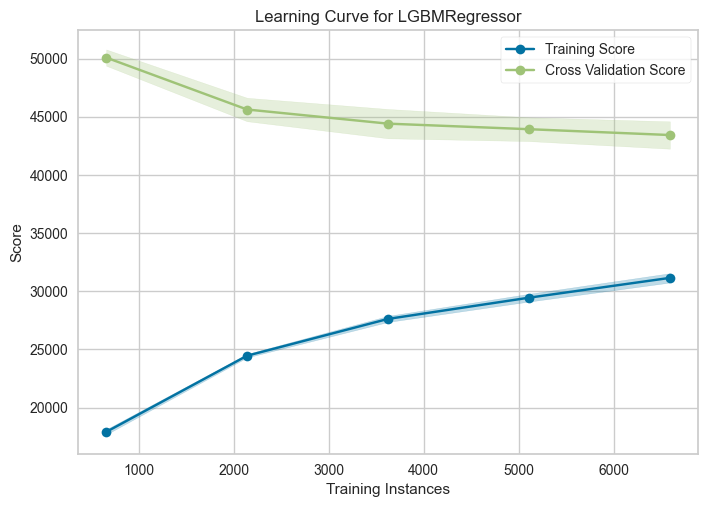

<Axes: title={'center': 'Learning Curve for LGBMRegressor'}, xlabel='Training Instances', ylabel='Score'>

In [72]:
from yellowbrick.model_selection import LearningCurve
from sklearn.metrics import mean_squared_error, make_scorer

X= exp3.get_config('X_train_transformed')
y= exp3.get_config('y_train_transformed')


learning_curve = LearningCurve(hyper_exp3, scoring=make_scorer(mean_squared_error,squared=False))

learning_curve.fit(X, y)
learning_curve.show()

- Pada jumlah data training yang sedikit (sekitar 1000), model menunjukkan training score yang rendah tetapi cross validation score yang tinggi, menunjukkan bahwa model overfitting.
- Seiring bertambahnya jumlah data training, jarak antara training score dan cross validation berkurang. Ini menunjukkan bahwa model menjadi lebih baik dalam menggeneralisasi dan tidak hanya menyesuaikan data training saja.
- Cross Validation score terus menurun seiring bertambahnya data pelatihan, yang menunjukkan bahwa model memanfaatkan lebih banyak data pelatihan untuk meningkatkan performa prediksi pada data baru.
- Meskipun ada penurunan pada cross validation score, penurunannya mulai melambat saat mencapai sekitar 6000 data. Ini menunjukkan bahwa tambahan data pelatihan lebih lanjut mungkin tidak memberikan peningkatan performa yang signifikan.

Secara keseluruhan, model LGBMRegressor memanfaatkan lebih banyak data training untuk mengurangi kesalahan prediksi pada data validation, memperbaiki kemampuan generalisasi, dan mengurangi overfitting seiring bertambahnya jumlah data training.

#### 2. **Residual Analysis**

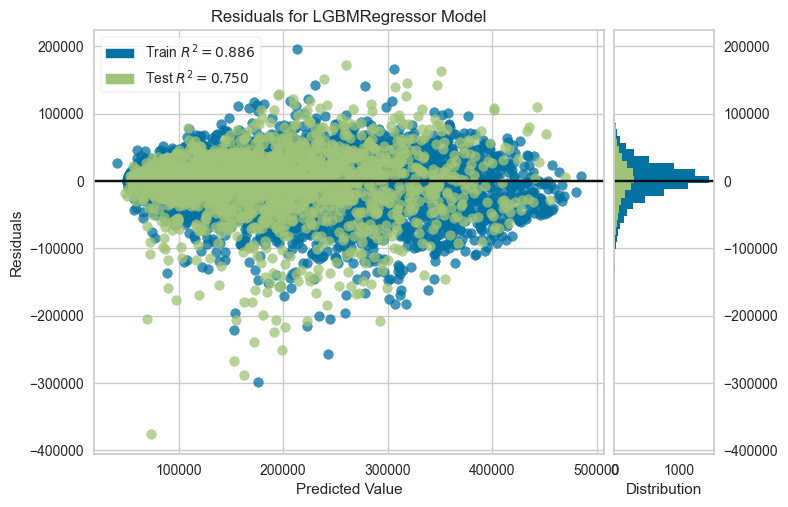

In [73]:
residual_analysis =  exp3.plot_model(hyper_exp3, plot='residuals')

Dengan menggunakan model Light Gradient Boosting Machine, nilai prediksi berkisar dari sekitar 0 hingga 500.000. Sedangkan Residual berkisar dari sekitar -400.000 hingga 200.000. Model Light Gradient Boosting Machine menunjukkan mayoritas performa prediksi yang akurat, dengan sebagian besar residual berada dekat dengan nol. Meskipun nilai MAPE di bawah 20%, dari grafik di atas kita dapat melihat masih terdapat kecenderungan overfitting.

**R-Squared (R²)**
- **Train R² = 0.886:** Ini menunjukkan bahwa 88,6% variabilitas dalam data pelatihan dapat dijelaskan oleh model. Ini adalah indikasi bahwa model fit dengan baik pada data pelatihan.
- **Test R² = 0.750:** Ini menunjukkan bahwa 75% variabilitas dalam data uji dapat dijelaskan oleh model. Nilai ini lebih rendah dari data pelatihan karena model terlalu menyesuaikan diri dengan data pelatihan sehingga tidak dapat menggeneralisasi dengan baik pada data baru (pengujian).

**Distribusi Residual**
- Idealnya, residu harus terdistribusi secara simetris di sekitar garis nol, menunjukkan bahwa model tidak memiliki bias sistematis dalam memprediksi nilai yang lebih tinggi atau lebih rendah dari nilai sebenarnya.
- Pada gambar, distribusi residual untuk kedua set data (train dan test) cenderung terpusat di sekitar garis nol, tetapi terdapat beberapa penyimpangan yang lebih besar pada data pengujian.

**Homoskedastisitas**
- Residual pada data pengujian memiliki lebih banyak variasi saat nilai prediksi meningkat, yang dapat menunjukkan adanya heteroskedastisitas (varians residu yang tidak konstan). Hal ini dapat ditangani lebih lanjut dengan cara Transformasi Logaritma dari variabel dependent atau independent untuk mengurangi heteroskedastisitas, menggunakan regresi WLS di mana setiap observasi memiliki bobot yang sebanding dengan invers dari varians residu, atau memodelkan varians residu sebagai fungsi dari variabel independen menggunakan metode Generalized Least Squares (GLS).

**Outliers**
- Beberapa titik data berada jauh dari garis nol, menunjukkan adanya outliers atau titik data dengan kesalahan prediksi yang besar. Ini mungkin menunjukkan data yang tidak biasa atau anomali dalam dataset.

**Distribusi Residual pada Sisi Kanan Grafik**
- Histogram residual di sisi kanan grafik menunjukkan distribusi yang mendekati distribusi normal dengan puncak di sekitar nol, yang merupakan indikasi positif bahwa residual didistribusikan secara normal.

Mari kita lihat data yang menghasilkan prediksi outliers.

In [74]:
validation_sets = exp3.predict_model(hyper_exp3, data = df_seen3)

In [75]:
validation_sets['residuals'] = validation_sets['prediction_label'] -  validation_sets['median_house_value']
residual_label = validation_sets[(validation_sets['residuals'] <= -100000) | (validation_sets['residuals'] >= 100000)]

In [76]:
residual_label.describe(include='all')

,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,city_name,median_house_value,prediction_label,residuals
count,208.000000,208.000000,208.000000,208.000000,208.000000,208.000000,208,208,208.0000,208.000000,208.000000
unique,NaN,NaN,NaN,NaN,NaN,NaN,4,148,NaN,NaN,NaN
top,NaN,NaN,NaN,NaN,NaN,NaN,<1H OCEAN,Hollywood,NaN,NaN,NaN
freq,NaN,NaN,NaN,NaN,NaN,NaN,116,7,NaN,NaN,NaN
mean,26.221153,2443.937500,512.721130,1185.355713,466.403839,3.929543,NaN,NaN,327070.6875,237366.843764,-89703.829313
std,11.147199,1884.507446,397.778076,886.423706,353.308533,1.533160,NaN,NaN,121518.8125,73050.574201,114129.411299
min,2.000000,20.000000,5.000000,14.000000,5.000000,1.164200,NaN,NaN,17500.0000,69542.316252,-376266.174732
25%,18.000000,1331.000000,245.500000,583.750000,224.000000,2.849750,NaN,NaN,255325.0000,189114.134999,-149422.736070
50%,26.000000,2075.000000,417.500000,980.500000,379.000000,3.799350,NaN,NaN,350000.0000,233512.934634,-120206.666190
75%,34.250000,3155.750000,696.250000,1630.000000,644.250000,4.906250,NaN,NaN,418875.0000,289781.788617,-103718.532435


Di sini kita melihat bahwa outilers terjadi pada `city_name` Hollywood, kategori `ocen_proximity` '<1H OCEAN', dan `median_income` berkisar antara 3,929543 - 10,8634 (dalam puluhan ribu dollar).

Kesimpulannya, model Light Gradient Boostiing Machine tampaknya mengalami overfitting, karena perbedaan yang cukup besar antara performa pada data pelatihan dan pengujian. Terdapat beberapa outliers yang signifikan dalam data yang bisa mempengaruhi akurasi prediksi model. Penanganan lebih lanjut terhadap outliers mungkin diperlukan untuk meningkatkan kinerja model. Penanganan tersebut bisa seperti:<br>
    1. Menghapus data outliers secara manual jika jumlahnya sedikit dan dapat diidentifikasi dengan jelas.<br>
    2. Menggunakan Log Transform untuk mengurangi pengaruh outliers.<br>
    3. Pembatasan nilai outliers (Capping/Flooring)<br>
    4. Mengganti nilai outliers dengan median atau mean dari data atau mengganti nilai outliers berdasarkan nilai tetangga terdekat dalam data.<br>
    5. Menggunakan teknik resampling seperti bootstrapping untuk menguji kestabilan model terhadap outliers

### **Model Interpretation**

- **Cara Kerja Model**<br>
<br>
Model Light Gradient Boosting Machine biasanya awalnya adalah model yang sangat sederhana, seperti single decision tree atau linear model. Model ini menggunakan pendekatan boosting, yang berarti ia membangun serangkaian model secara bertahap. Setiap iterasi dari algoritma berfokus pada memperbaiki kesalahan prediksi model sebelumnya. Proses ini dilakukan secara iteratif hingga mencapai titik berhenti yang ditentukan, seperti jumlah iterasi maksimum atau ketika peningkatan performa sudah tidak signifikan lagi. Proses utama dalam Light Gradient Boosting Machine adalah menyesuaikan model berdasarkan gradien fungsi kerugian (_loss function_). Gradien ini memberikan arah yang menunjukkan bagaimana model harus disesuaikan agar kesalahan prediksinya berkurang. Light Gradient Boosting Machine menggunakan pendekatan yang efisien untuk menghitung gradien dan menyesuaikan modelnya.<br>
<br>
Salah satu keunggulan Light Gradient Boosting Machine adalah kemampuannya untuk melakukan pembelajaran secara paralel. Ini berarti beberapa pohon (_trees_) dapat dilatih secara bersamaan, meningkatkan efisiensi algoritma ini, terutama pada dataset yang besar. Kemudian untuk menghindari overfitting, Light Gradient Boosting Machine menyediakan berbagai parameter regularisasi yang dapat disesuaikan oleh pengguna. Ini termasuk parameter seperti kedalaman pohon (_tree depth_), jumlah pohon (_number of trees_), dan laju pembelajaran (_learning rate_). Setelah pelatihan selesai, model Light Gradient Boosting Machine menggabungkan prediksi dari setiap pohon untuk menghasilkan prediksi akhir.<br>
<br>
Dengan kombinasi dari langkah-langkah ini, LightGBM mampu memberikan hasil yang baik dalam berbagai tugas machine learning, terutama pada dataset yang besar dengan fitur yang kompleks.

In [77]:
df_trial_drop.describe()

,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,12873.000000,12873.000000,12873.000000,12873.000000,12873.000000,12873.000000,12873.000000
mean,26.939719,2673.930941,548.897615,1469.443486,509.052824,3.689578,189568.554105
std,11.429708,2236.559100,433.255534,1183.018573,392.471789,1.561545,95785.768316
min,1.000000,2.000000,2.000000,3.000000,2.000000,0.499900,14999.000000
25%,17.000000,1460.000000,299.000000,808.000000,283.000000,2.541700,115600.000000
50%,27.000000,2143.000000,442.000000,1203.000000,416.000000,3.477300,171600.000000
75%,36.000000,3182.000000,661.000000,1776.000000,615.000000,4.609800,243000.000000
max,51.000000,32627.000000,6445.000000,35682.000000,6082.000000,15.000100,500000.000000


- **Limitasi Model**<br>
<br>
Hasil dari model ini hanya berkerja dengan baik untuk memprediksi harga rumah di California, US. Tentunya dengan beberapa kriteria:<br>
a. `housing_median_age`: Umur rumah berkisar antara 1 - 51 tahun.<br>
b. `total_rooms`: Jumlah total ruangan dalam satu blok berkisar antara 2 - 32.627 ruangan.<br>
c. `total_bedrooms`: Jumlah total kamar tidur dalam satu blok berkisar antara 1 - 6.445 kamar tidur.<br>
d. `population`: Jumlah penduduk dalam satu blok berkisar antara 3 - 35.682 penduduk.<br>
e. `households`: Jumlah rumah tangga dalam satu blok berkisar antara 2 - 6.082 rumah tangga.<br>
f. `median_income`: Median pendapatan penduduk dalam satu blok berkisar antara 0,4999 USD - 15,0001 USD (dalam puluhan ribu dollar).<br>
g. `median_house_value`: Harga rumah berkisar antara 14.999 USD - 500.000 USD.<br>

    Di luar dari kriteria di atas, tentunya model akan menghasilkan prediksi yang bias.

- **Feature Importance**

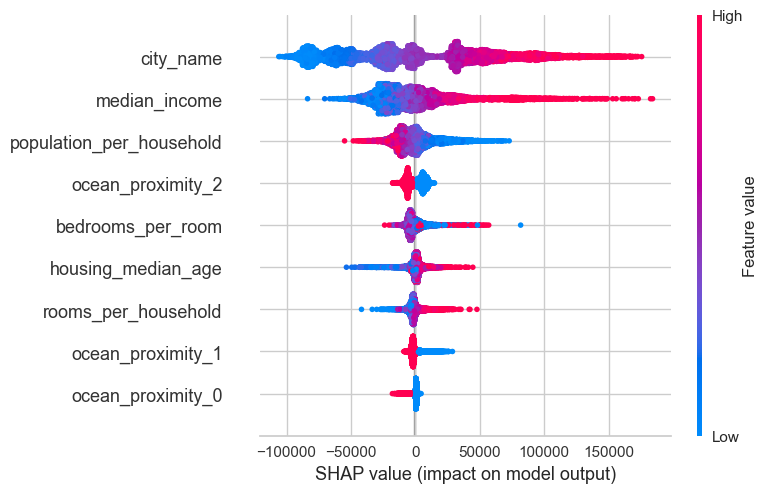

In [78]:
important_features = exp3.interpret_model(hyper_exp3, use_train_data=True)

 - `city_name`: Memiliki variasi dampak yang cukup besar terhadap prediksi, namun tidak ada pola warna yang sangat jelas yang menunjukkan bahwa pengaruhnya mungkin lebih kompleks atau tidak linier. Dari grafik, kita bisa melihat bahwa nilai SHAP untuk `city_name` memiliki rentang yang luas, dari nilai negatif besar hingga nilai positif besar. Ini menunjukkan bahwa nama kota bisa sangat menurunkan atau sangat meningkatkan prediksi model. Maksudnya adalah, lokasi bisa memiliki dampak positif atau negatif yang signifikan terhadap prediksi, namun pola ini tidak mudah ditebak hanya berdasarkan nilai tinggi atau rendah dari fitur ini.

- `median_income`: Pendapatan median memiliki dampak yang signifikan. Nilai yang lebih tinggi (merah) cenderung meningkatkan prediksi secara signifikan, sementara nilai yang lebih rendah (biru) menurunkan prediksi. Ini menunjukkan semakin besar pendapatan dari di wilayah tersebut, maka akan semakin meningkatkan nilai prediksi. Begitupun sebaliknya.

- `population_per_household`: Populasi per rumah tangga menunjukkan bahwa nilai yang lebih rendah (biru) cenderung memiliki dampak positif sedang, sementara nilai yang lebih tinggi (merah) memiliki dampak negatif. Ini menunjukkan semakin besar rasionya atau semakin banyak populasinya, maka akan semakin mengurangi nilai prediksi. Begitupun sebaliknya.

- `ocean_proximity_2`: Kedekatan dengan laut kategori 2 memiliki dampak yang bervariasi, dengan pola warna yang tidak sangat jelas. Maksudnya adalah nilai properti terkait dengan kedekatan dengan laut bisa sangat bervariasi tergantung pada region. Di beberapa daerah, kedekatan dengan laut bisa sangat meningkatkan nilai properti, sementara di daerah lain mungkin tidak terlalu signifikan.

- `bedrooms_per_room`: Jumlah kamar tidur per ruangan dengan nilai yang lebih tinggi (merah) cenderung memiliki dampak negatif, sedangkan nilai yang lebih rendah (biru) memiliki dampak positif. Ini menunjukkan semakin besar rasionya, maka akan semakin mengurangi nilai prediksi. Begitupun sebaliknya.

- `housing_median_age`: Usia median perumahan menunjukkan bahwa nilai yang lebih tinggi (merah) memiliki dampak negatif, sedangkan nilai yang lebih rendah (biru) memiliki dampak positif. Ini menunjukkan bahwa semakin tua umur rumah maka semakin menurunkan harga prediksinya. Begitupun sebaliknya.

- `rooms_per_household`: Jumlah ruangan per rumah tangga memiliki pola yang lebih kompleks dengan variasi dampak. Pada grafik, kita melihat titik-titik berwarna merah (nilai tinggi) dan biru (nilai rendah) tersebar di kedua sisi sumbu vertikal (positif dan negatif), yang menunjukkan bahwa tidak ada pola yang konsisten seperti fitur lainnya. Ini menandakan bahwa dampak dari `rooms_per_household` bisa positif atau negatif tergantung pada situasi tertentu. Misalnya, dalam lingkungan dengan pendapatan yang tinggi, banyaknya ruangan per rumah tangga mungkin dianggap sebagai tanda kemewahan, sementara di lingkungan dengan pendapatan rendah, ini mungkin dianggap tidak efisien atau tidak diperlukan.

- `ocean_proximity_1` dan `ocean_proximity_0`: Kedekatan dengan laut kategori 1 dan 0 menunjukkan variasi dampak yang kurang signifikan dan pola warna yang tidak jelas. Sama seperti `ocean_proximity_2`, nilai properti terkait dengan kedekatan dengan laut bisa sangat bervariasi tergantung pada region. Di beberapa daerah, kedekatan dengan laut bisa sangat meningkatkan nilai properti, sementara di daerah lain mungkin tidak terlalu signifikan.

#### 1. **Predict to Validation Sets**

In [79]:
# Melakukan prediksi ke validasi set

pred_to_train = exp3.predict_model(hyper_exp3, data=exp3.get_config('train'))

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Light Gradient Boosting Machine,22779.5507,1043035264.6582,32296.0565,0.8861,0.1818,0.1384


In [80]:
predict_to_validation = exp3.predict_model(hyper_exp3)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Light Gradient Boosting Machine,31381.8723,2198186774.6976,46884.8246,0.7500,0.2443,0.1792


Terdapat perbedaan sekitar 4% antara `MAPE` di data train dengan validasi. Seperti yang sudah dijelaskan di atas, hal ini dikarenakan oleh beberapa fitur dengan kriteria seperti `median_income` berkisar 3,929543 - 10,8634 (dalam puluhan ribu dollar), `ocen_proximity` dengan kategori '<1H OCEAN', dan `city_name` berada di kota Hollywood.

### **Finalize Model**

In [81]:
finalize = exp3.finalize_model(hyper_exp3)
finalize

Pipeline(memory=FastMemory(location=C:\Users\user\AppData\Local\Temp\joblib),
         steps=[('cleaning',
                 TransformerWrapper(transformer=TransformerWrapper(include=['total_rooms',
                                                                            'total_bedrooms',
                                                                            'population',
                                                                            'households'],
                                                                   transformer=Cleaning3()))),
                ('binary',
                 TransformerWrapper(transformer=TransformerWrapper(include=['ocean_proximity'],
                                                                   transformer=BinaryEnco...
                                                                  transformers=[('scaler',
                                                                                 RobustScaler(),
                                                                                 ['housing_median_age',
                                                                                  'median_income',
                                                                                  'rooms_per_household',
                                                                                  'bedrooms_per_room',
                                                                                  'population_per_household'])],
                                                                  verbose_feature_names_out=False))),
                ('actual_estimator',
                 LGBMRegressor(learning_rate=0.05, max_depth=7,
                               min_child_samples=10, n_estimators=200,
                               n_jobs=-1, num_leaves=40, random_state=10,
                               reg_alpha=0, reg_lambda=0.5))])

### **Predict to Test Sets**

In [82]:
prediction_to_unseen = exp3.predict_model(finalize, data=df_unseen3)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Light Gradient Boosting Machine,31193.2033,2196073758.7595,46862.2850,0.7696,0.2511,0.1881


Dilihat dari `MAPE` antara Hasil Training dan Hasil Prediksi, `MAPE` Hasil prediksi yaitu 0,1881. Dilihat dari nilainya, masih di bawah 20%. Hal ini menjadikan model yang telah kita buat termasuk ke dalam 'Good Forecasting' (Lewis, 1982).

*Source: Lewis, C. D. (1982). Industrial and business forecasting methods: A practical guide to exponential smoothing and curve fitting*

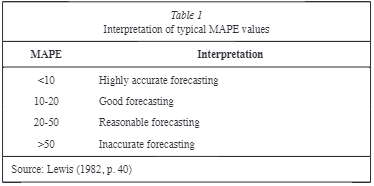

### **Advance Analysis**

In [83]:
prediction = prediction_to_unseen[['median_house_value', 'prediction_label']]
prediction.head(5)

,median_house_value,prediction_label
1361,129300.0,166392.005044
4534,296100.0,298593.307332
10548,173300.0,191350.246971
4805,86700.0,79412.636495
5273,89500.0,128613.667378


In [84]:
def add_error(data, error_percentage):
    return data * (1 + error_percentage / 100)

error_percentages = [10, 20, 30]

# Menambahkan error untuk skenario overpredict dan underpredict
scenarios = {}
for error in error_percentages:
    scenarios[f'over_noML{error}%'] = add_error(prediction['median_house_value'], error)
    scenarios[f'under_noML{error}%'] = add_error(prediction['median_house_value'], -error)

df_scenarios = pd.DataFrame(scenarios)
df_results = pd.concat([prediction, df_scenarios], axis=1)
df_bussiness = df_results.round().astype(int)
display(df_bussiness.head())

,median_house_value,prediction_label,over_noML10%,under_noML10%,over_noML20%,under_noML20%,over_noML30%,under_noML30%
1361,129300,166392,142230,116370,155160,103440,168090,90510
4534,296100,298593,325710,266490,355320,236880,384930,207270
10548,173300,191350,190630,155970,207960,138640,225290,121310
4805,86700,79413,95370,78030,104040,69360,112710,60690
5273,89500,128614,98450,80550,107400,71600,116350,62650


In [85]:
df_bussiness.describe()

,median_house_value,prediction_label,over_noML10%,under_noML10%,over_noML20%,under_noML20%,over_noML30%,under_noML30%
count,2575.000000,2575.000000,2575.000000,2575.000000,2575.000000,2575.000000,2575.000000,2575.000000
mean,192199.378252,190951.813204,211419.316117,172979.440388,230639.253981,153759.502524,249859.191845,134539.564660
std,97651.258428,86093.357928,107416.384200,87886.132655,117181.509972,78121.006883,126946.635744,68355.881111
min,14999.000000,52118.000000,16499.000000,13499.000000,17999.000000,11999.000000,19499.000000,10499.000000
25%,117050.000000,124672.500000,128755.000000,105345.000000,140460.000000,93640.000000,152165.000000,81935.000000
50%,175000.000000,178770.000000,192500.000000,157500.000000,210000.000000,140000.000000,227500.000000,122500.000000
75%,246400.000000,242634.500000,271040.000000,221760.000000,295680.000000,197120.000000,320320.000000,172480.000000
max,500000.000000,471930.000000,550000.000000,450000.000000,600000.000000,400000.000000,650000.000000,350000.000000


In [86]:
bins = [0, 50000, 100000, 200000, 300000, 400000, 500000, float('inf')]
labels = ['0-50k', '50k-100k', '101k-200k', '201k-300k', '301k-400k', '401k-500k','>500k']
df_bussiness['bin'] = pd.cut(df['median_house_value'], bins=bins, labels=labels)


**Asumsi**
- Ketika terjadi overpredict, maka Developer harus mengeluarkan biaya maintenance dikarenakan rumah yang belum laku terjual.
- Biaya perawatan rumah di Amerika Serikat: 6.413 USD per tahun.
- Ketika terjadi underpredict, maka Developer menanggung kerugian sebesar kesalahan prediksi tersebut karena harga rumah yang lebih murah.

In [87]:
def calculate_costs_per_bin(df_bussiness, prediction_col, actual_col='median_house_value'):
    maintenance_per_year = 6413

    cost_data = []

    for label in labels:
        bin_df = df_bussiness[df_bussiness['bin'] == label]
        overpredict_cost = 0
        underpredict_cost = 0
        
        for idx, row in bin_df.iterrows():
            predicted = row[prediction_col]
            actual = row[actual_col]
            
            if predicted > actual:
                overpredict_house = predicted - actual
                overpredict_cost += overpredict_house + maintenance_per_year
            elif predicted < actual:
                underpredict_cost += actual - predicted
        
        cost_data.append((label, overpredict_cost, underpredict_cost))
    
    return pd.DataFrame(cost_data, columns=['bin', 'overpredict_cost', 'underpredict_cost'])

scenarios = ['prediction_label'] + [f'over_noML{error}%' for error in error_percentages] + [f'under_noML{error}%' for error in error_percentages]
bin_results = {}

for scenario in scenarios:
    bin_results[scenario] = calculate_costs_per_bin(df_bussiness, scenario)

# Menggabungkan hasil ke dalam satu DataFrame
df_bin_summary = pd.concat(bin_results, axis=1)
df_bin_summary.columns = [' '.join(col).strip() for col in df_bin_summary.columns.values]
df_bin_summary = df_bin_summary[['prediction_label bin', 'prediction_label overpredict_cost', 'prediction_label underpredict_cost', 'over_noML10% overpredict_cost', 'over_noML20% overpredict_cost', 'over_noML30% overpredict_cost', 'under_noML10% underpredict_cost', 'under_noML20% underpredict_cost', 'under_noML30% underpredict_cost']]
display(df_bin_summary)


,prediction_label bin,prediction_label overpredict_cost,prediction_label underpredict_cost,over_noML10% overpredict_cost,over_noML20% overpredict_cost,over_noML30% overpredict_cost,under_noML10% underpredict_cost,under_noML20% underpredict_cost,under_noML30% underpredict_cost
0,0-50k,294235,195107,565643,996613,1427583,430970,861940,1292910
1,50k-100k,7850774,6796347,10682490,18735650,26788810,8053160,16106320,24159480
2,101k-200k,19363883,16109528,26155340,45705290,65255240,19549950,39099900,58649850
3,201k-300k,11592353,10989273,16391931,28634651,40877371,12242720,24485440,36728160
4,301k-400k,4828933,4310609,6916128,12126398,17336668,5210270,10420540,15630810
5,401k-500k,1428931,1215351,2234463,3949473,5664483,1715010,3430020,5145030
6,>500k,2045846,2151280,3058820,5348080,7637340,2289260,4578520,6867780


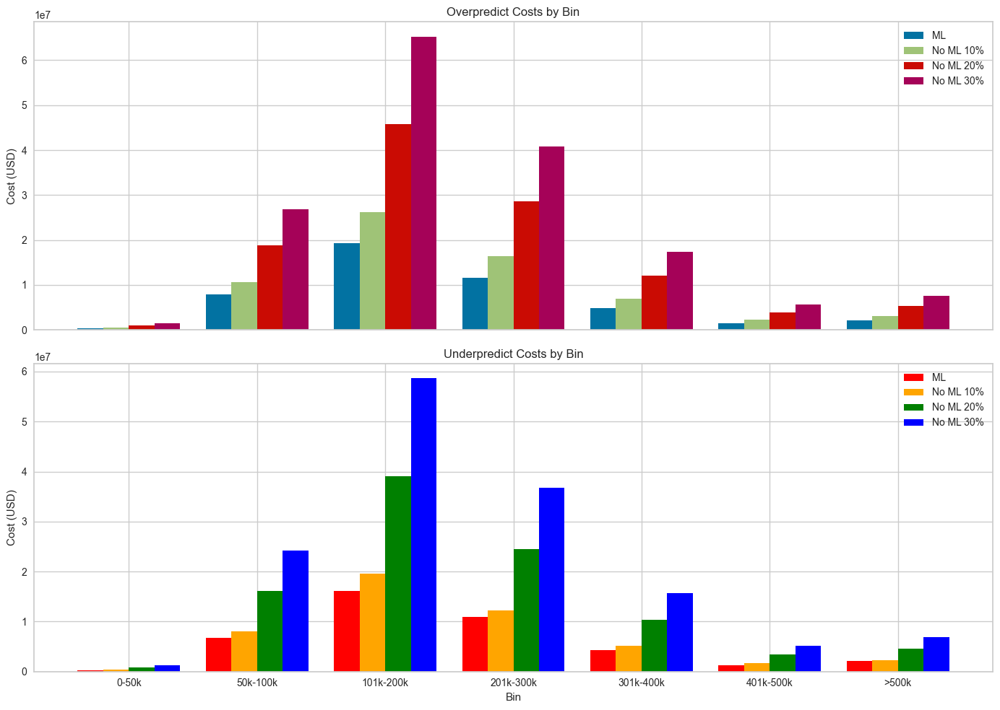

In [88]:
# Plot Overpredict Costs
fig, ax = plt.subplots(2, 1, figsize=(14, 10), sharex=True)

bins = df_bin_summary['prediction_label bin']
x = range(len(bins))

# Plot Overpredict Costs
ax[0].bar(x, df_bin_summary['prediction_label overpredict_cost'], width=0.2, label='ML', align='center')
ax[0].bar([p + 0.2 for p in x], df_bin_summary['over_noML10% overpredict_cost'], width=0.2, label='No ML 10%', align='center')
ax[0].bar([p + 0.4 for p in x], df_bin_summary['over_noML20% overpredict_cost'], width=0.2, label='No ML 20%', align='center')
ax[0].bar([p + 0.6 for p in x], df_bin_summary['over_noML30% overpredict_cost'], width=0.2, label='No ML 30%', align='center')
ax[0].set_title('Overpredict Costs by Bin')
ax[0].set_ylabel('Cost (USD)')
ax[0].set_xticks([p + 0.3 for p in x])
ax[0].set_xticklabels(bins)
ax[0].legend()

# Plot Underpredict Costs
ax[1].bar(x, df_bin_summary['prediction_label underpredict_cost'], width=0.2, label='ML', align='center', color='red')
ax[1].bar([p + 0.2 for p in x], df_bin_summary['under_noML10% underpredict_cost'], width=0.2, label='No ML 10%', align='center', color='orange')
ax[1].bar([p + 0.4 for p in x], df_bin_summary['under_noML20% underpredict_cost'], width=0.2, label='No ML 20%', align='center', color='green')
ax[1].bar([p + 0.6 for p in x], df_bin_summary['under_noML30% underpredict_cost'], width=0.2, label='No ML 30%', align='center', color='blue')
ax[1].set_title('Underpredict Costs by Bin')
ax[1].set_ylabel('Cost (USD)')
ax[1].set_xticks([p + 0.3 for p in x])
ax[1].set_xticklabels(bins)
ax[1].set_xlabel('Bin')
ax[1].legend()

plt.tight_layout()
plt.show()

**`Interpretasi Hasil Visualisasi`**

1. **Overpredict Costs by Bin**:
   - Biaya overpredict ketika menggunakan model machine learning cukup rendah di semua harga rumah, dengan biaya tertinggi berada di harga rumah antara 101000 USD - 200000 USD dan 201000 USD - 300000 USD.
   - Biaya overpredict meningkat secara signifikan seiring dengan peningkatan persentase error. Ini menunjukkan bahwa tanpa machine learning, biaya overpredict bisa jauh lebih tinggi terutama pada harga rumah yang lebih tinggi (contoh: harga rumah antara 101000 USD - 200000 USD dan 201000 USD - 300000 USD).
   - Terlihat bahwa penggunaan machine learning secara signifikan mengurangi biaya overpredict dibandingkan dengan skenario overpredict tanpa machine learning, terutama pada rumah dengan harga yang lebih besar.

2. **Underpredict Costs by Bin**:
   - Biaya underpredict ketika menggunakan model machine learning cukup tinggi di semua harga rumah, dengan biaya tertinggi berada di harga antara 201000 USD - 300000 USD dan 301000 USD - 400000 USD.
   - Biaya underpredict meningkat secara drastis seiring dengan peningkatan persentase error. Ini menunjukkan bahwa tanpa machine learning, biaya underpredict bisa jauh lebih tinggi terutama pada harga rumah yang lebih tinggi.
   - **Pola Biaya**: Terlihat bahwa penggunaan machine learning membantu dalam mengurangi biaya underpredict dibandingkan dengan skenario underpredict tanpa machine learning. Namun, biaya underpredict dengan machine learning tetap cukup signifikan, menunjukkan pentingnya mengoptimalkan prediksi untuk meminimalkan biaya ini.

## **Conclussion**

- **Hasil Pemodelan:**<br>

   Berdasarkan pemodelan yang sudah dilakukan, fitur `city_name` yang kita hasilkan dari `longitude` dan `latitude` dan fitur `median_income` menjadi fitur yang paling berpengaruh terhadap `median_house_value`. Hal ini sangat masuk akal karena kita dapat menyimpulkan bahwa lokasi dan penghasilan penduduk sekitar menjadi acuan dalam menentukan harga rumah. Ketika rumah tersebut berada dalam kawasan elit yang tentu saja notabene penghasilan penduduknya tinggi, harga rumahnya pasti juga akan tinggi. Begitu pula sebaliknya.

   Jika kita melihat berdasarkan nilai RMSE, didapati nilai RMSE cukup tinggi, hal ini dikarenakan metric RMSE memiliki beberapa kelemahan: RMSE tergantung oleh skala dari data. Jadi, semakin besar skala maka nilai RMSE-nya juga semakin besar. RMSE juga dipengaruhi oleh outlier, semakin banyak outlier maka RMSE juga bisa semakin besar. Seperti yang kita ketahui data kita memiliki outlier yg cukup banyak, tapi jika outlier-nya dihilangkan maka kita akan kehilangan informasi yang banyak pula. Oleh karena itu pada kasus ini kita lebih melihat hasil pemodelan menggunakan metric MAPE yang tidak terlalu sensitive terhadap adanya outlier, dimana hasil dari metric MAPE sendiri yg sebesar 18% yang artinya persen kesalahan hasil prediksi data dibanding data aktual hanya sekitar 18%. Selain itu nilai MAPE 18% artinya termasuk kedalam kategory **Good Forecast** atau model peramalan baik, meskipun hasil pemodelan masih cenderung overfitting.

- **Limitasi Model**<br>
Hasil dari model ini hanya berkerja dengan baik untuk memprediksi harga rumah di California, US. Tentunya dengan fitur yang sama dan beberapa kriteria:<br>
a. `housing_median_age`: Umur rumah berkisar antara 1 - 51 tahun.<br>
b. `total_rooms`: Jumlah total ruangan dalam satu blok berkisar antara 2 - 32.627 ruangan.<br>
c. `total_bedrooms`: Jumlah total kamar tidur dalam satu blok berkisar antara 1 - 6.445 kamar tidur.<br>
d. `population`: Jumlah penduduk dalam satu blok berkisar antara 3 - 35.682 penduduk.<br>
e. `households`: Jumlah rumah tangga dalam satu blok berkisar antara 2 - 6.082 rumah tangga.<br>
f. `median_income`: Median pendapatan penduduk dalam satu blok berkisar antara 0,4999 USD - 15,0001 USD (dalam puluhan ribu dollar).<br>
g. `ocean_proximity`: Kategori kedekatan rumah dengan laut hanya untuk INLAND, NEAR BAY, <1H OCEAN, NEAR OCEAN, dan ISLAND.<br>
h. `median_house_value`: Harga rumah berkisar antara 14.999 USD - 500.000 USD.<br>

    Di luar dari kriteria di atas, tentunya model akan menghasilkan prediksi yang bias.

- **Dampak Terhadap Bisnis**

   1. **Efisiensi Machine Learning dalam Overpredict**:
      - Penggunaan machine learning secara signifikan mengurangi biaya overpredict dibandingkan dengan skenario manual. 
      - Pada semua harga, biaya overpredict dengan machine learning lebih rendah, menunjukkan bahwa machine learning memberikan prediksi yang lebih akurat dan efisien memprediksi harga rumah yang berlebihan.

   2. **Efisiensi Machine Learning dalam Underpredict**:
      - Penggunaan machine learning juga membantu mengurangi biaya underpredict dibandingkan dengan skenario manual. Namun, kerugian biaya underpredict dengan ML masih cukup signifikan pada rumah dengan harga yang lebih tinggi.
      - Untuk mengurangi kerugian biaya underpredict, penting untuk terus meningkatkan akurasi model machine learning.

   3. **Skala Penggunaan Machine Learning**:
      - Machine learning memberikan manfaat yang lebih besar dalam penentuan harga rumah yang lebih tinggi (contoh: 101000 USD - 400000 USD). Pada harga ini, biaya overpredict dan underpredict dapat dioptimalkan dengan lebih baik menggunakan machine learning.
      - Pada rumah dengan harga yang lebih rendah (contoh: 0 USD - 100000 USD), manfaat machine learning masih ada tetapi tidak sebesar pada harga yang lebih tinggi.


## **Recommendation**

- **Dari Segi Data**
    1. Data perlu diperbaharui karena menggunakan data tahun 1990. Tentunya jika digunakan untuk memprediksi harga rumah di masa sekarang menjadi tidak relevan karena adanya faktor inflasi dan lainnya.
    2. Penambahan fitur yang memiliki korelasi langsung dengan harga rumah. Seperti luas tanah, luas bangunan, jumlah ruangan, atau fasilitas yang ada di dalam rumah.

- **Dari Segi Model**
    1. Dari segi modeling, karena hasil prediksi cenderung overfitting dikarenakan oleh outliers. Beberapa cara untuk menanggulanginya adalah:
        - Menghapus data outliers secara manual jika jumlahnya sedikit dan dapat diidentifikasi dengan jelas.
        - Menggunakan Log Transform untuk mengurangi pengaruh outliers.
        - Pembatasan nilai outliers (Capping/Flooring).
        - Mengganti nilai outliers dengan median atau mean dari data atau mengganti nilai outliers berdasarkan nilai tetangga terdekat dalam data.
        - Menggunakan teknik resampling seperti bootstrapping untuk menguji kestabilan model terhadap outliers
        - Mencari parameter untuk tuning yang lebih baik, seperti menambahkan `lambda_l1`, `lambda_l2`, dan `min_gain_to_split` untuk regularisasi.
        - Menggunakan metode hyperparameter yang lebih baik seperti GridSearch.

## **Save Model**

In [91]:
# Save Model

# exp3.save_model(finalize, '../Model/final_model_270524')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=FastMemory(location=C:\Users\user\AppData\Local\Temp\joblib),
          steps=[('cleaning',
                  TransformerWrapper(transformer=TransformerWrapper(include=['total_rooms',
                                                                             'total_bedrooms',
                                                                             'population',
                                                                             'households'],
                                                                    transformer=Cleaning3()))),
                 ('binary',
                  TransformerWrapper(transformer=TransformerWrapper(include=['ocean_proximity'],
                                                                    transformer=BinaryEnco...
                                                                   transformers=[('scaler',
                                                                                  RobustScaler(),
                